In [4]:
from matplotlib import pyplot as plt
import numpy as np
from figure_v3 import plot_sig
from eeg_v2 import EEG
from utils import chunks, baseline_calc, butter_bandpass_filter
import joblib
from mne.preprocessing import ICA
from psd import plot_psd_v2

_scale_c = 9.0175556274876e-05
_path = "./figure3/"

from config import fontsize_label, fontsize_axis, dpi, figsize, n_tick
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams['figure.figsize'] = figsize


def _get_ica_map(ica, components=None):
    """Get ICA topomap for components"""
    fast_dot = np.dot
    if components is None:
        components = list(range(ica.n_components_))
    maps = fast_dot(ica.mixing_matrix_[:, components].T,
                    ica.pca_components_[:ica.n_components_])
    return maps

def get_chunks(sig):
    i = 0
    for task in sig.tasks:
        for c in chunks(task, 15):
            i+=1
            yield i, c
            
def count_chunks(sig):
    i = 0
    for task in sig.tasks:
        for c in chunks(task, 15):
            i+=1
    return i

# Reading raw data
path_edf="./edf/1612_alice/edf/A0001612.edf"
path_stage="./edf/1612_alice/csv/STAGE.csv"

eeg = EEG(path_edf=path_edf, path_stage=path_stage)

# Preprocessing pipeline
def baseline_bandpass(chunk):
    sample_raw = eeg.raw.copy().crop(np.min(chunk),np.max(chunk),include_tmax=False)
    sample_raw_eog = eeg.eog_channels.copy().crop(np.min(chunk),np.max(chunk),include_tmax=False)


    # Baseline
    sample_raw_baseline = sample_raw.copy()
    sample_raw_baseline = sample_raw_baseline.apply_function(baseline_calc)

    # Bandpass
    sample_raw_bandpass = sample_raw_baseline.copy()
    sample_raw_bandpass = sample_raw_bandpass.apply_function(butter_bandpass_filter)
    
    return sample_raw, sample_raw_baseline, sample_raw_bandpass, sample_raw_eog

# ICA pipeline
def ica_pipe(sample_raw_bandpass):    
    clf = joblib.load("./models/eog_classifier_v2.joblib")


    sample_raw_train = sample_raw_bandpass.copy()
    sample_raw_corrected = sample_raw_bandpass.copy()

    # Fitting ICA
    ica = ICA(method="extended-infomax", random_state=1)
    ica.fit(sample_raw_corrected)

    maps = _get_ica_map(ica).T
    scalings = np.linalg.norm(maps, axis=0)
    maps /= scalings[None, :]
    X = maps.T

    # Predict EOG
    eog_preds = clf.predict(X)
    list_of_eog = np.where(eog_preds == 1)[0]
    
    # ica.plot_sources(inst=sample_raw_train) 
    # ica.plot_components(inst=sample_raw_train)

    ica.exclude = list_of_eog
    ica.apply(sample_raw_corrected)
    
    return ica, sample_raw_train, sample_raw_corrected

plt.rcParams["figure.figsize"] = [10,10]


E:\OneDrive\Desktop\codes\ica_paper\eeg_v2.py:17: RuntimeWarning: Channel names are not unique, found duplicates for: {'EMG Chin'}. Applying running numbers for duplicates.
  raw = read_raw_edf(self.path_edf, preload=True, verbose=0)


Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.2s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
0


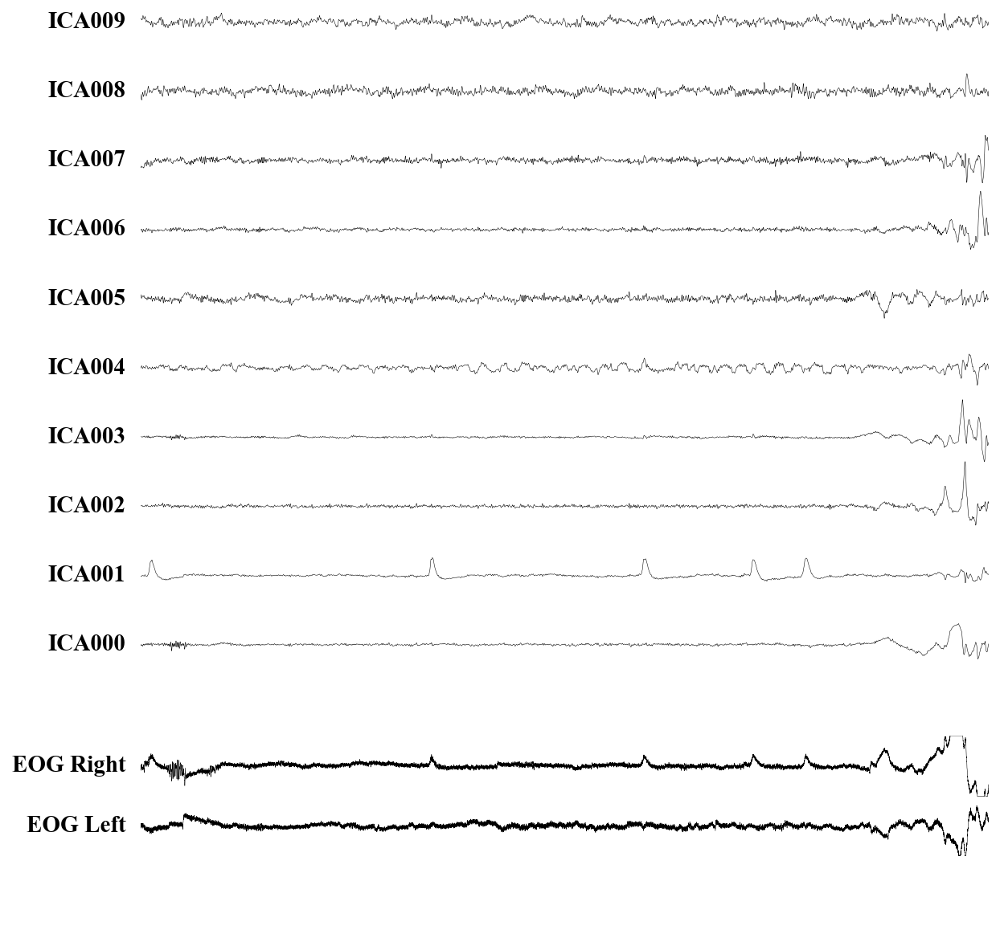

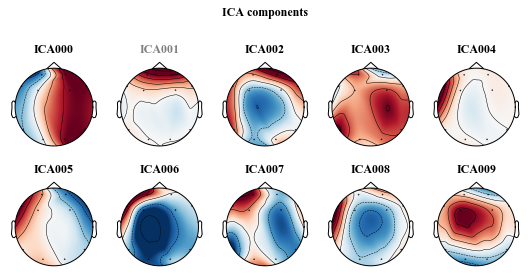

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.2s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
1


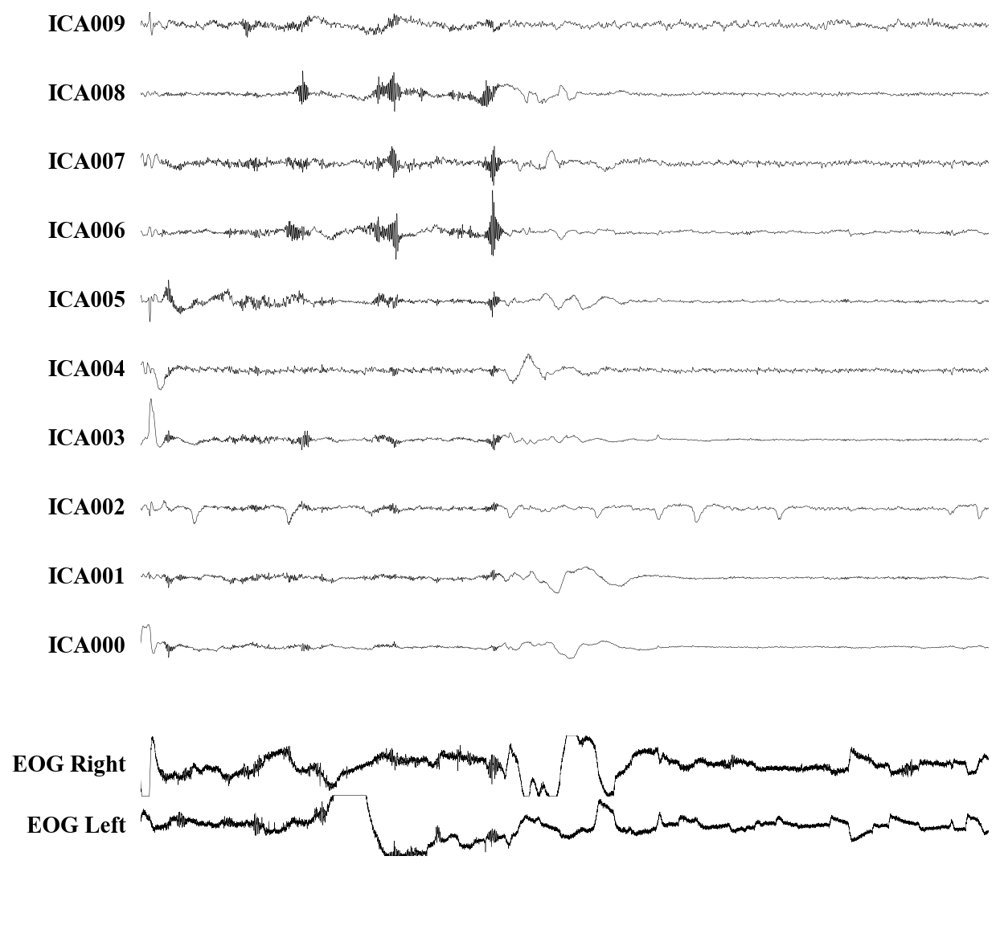

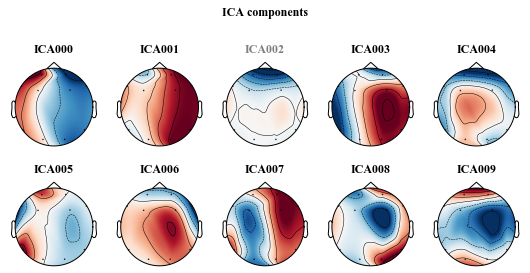

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.5s.
Transforming to ICA space (10 components)
Zeroing out 2 ICA components
2


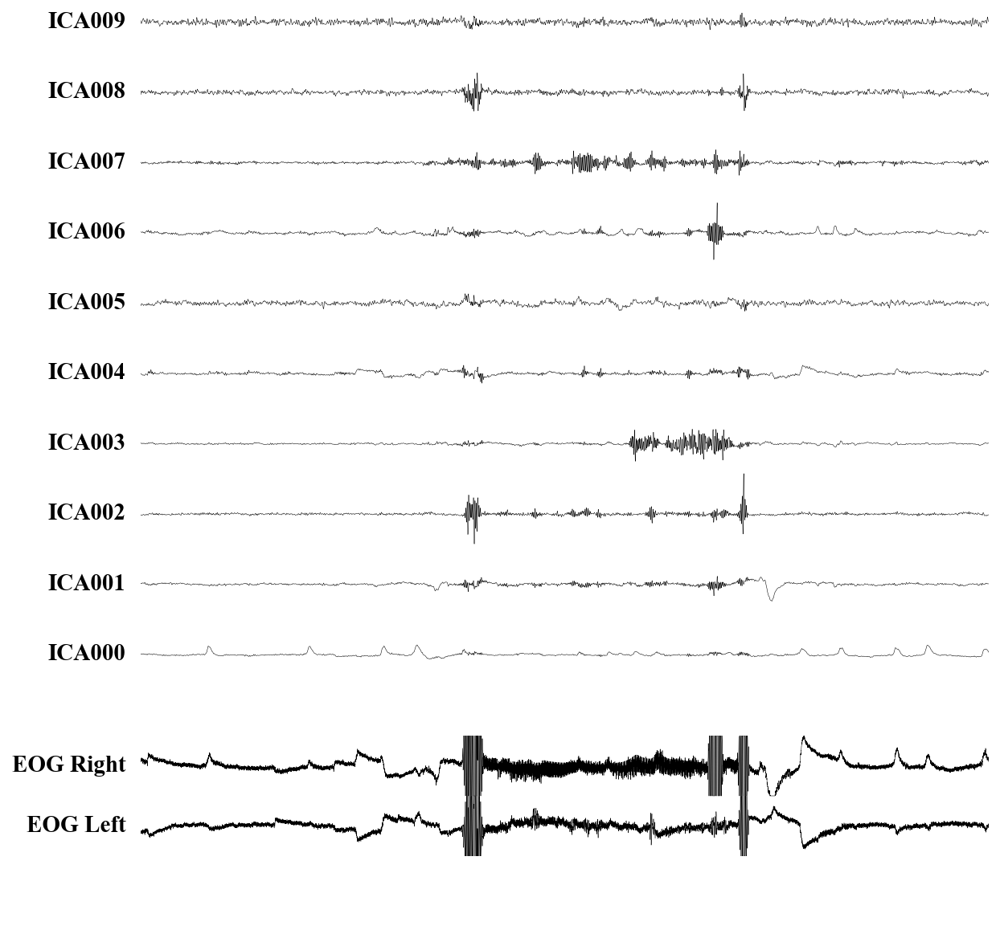

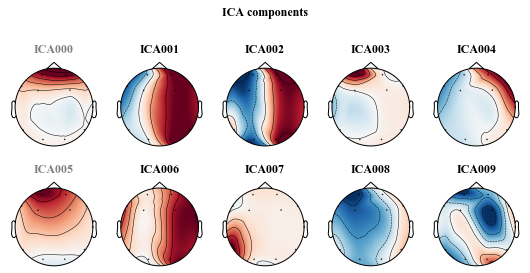

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.3s.
Transforming to ICA space (10 components)
Zeroing out 2 ICA components
3


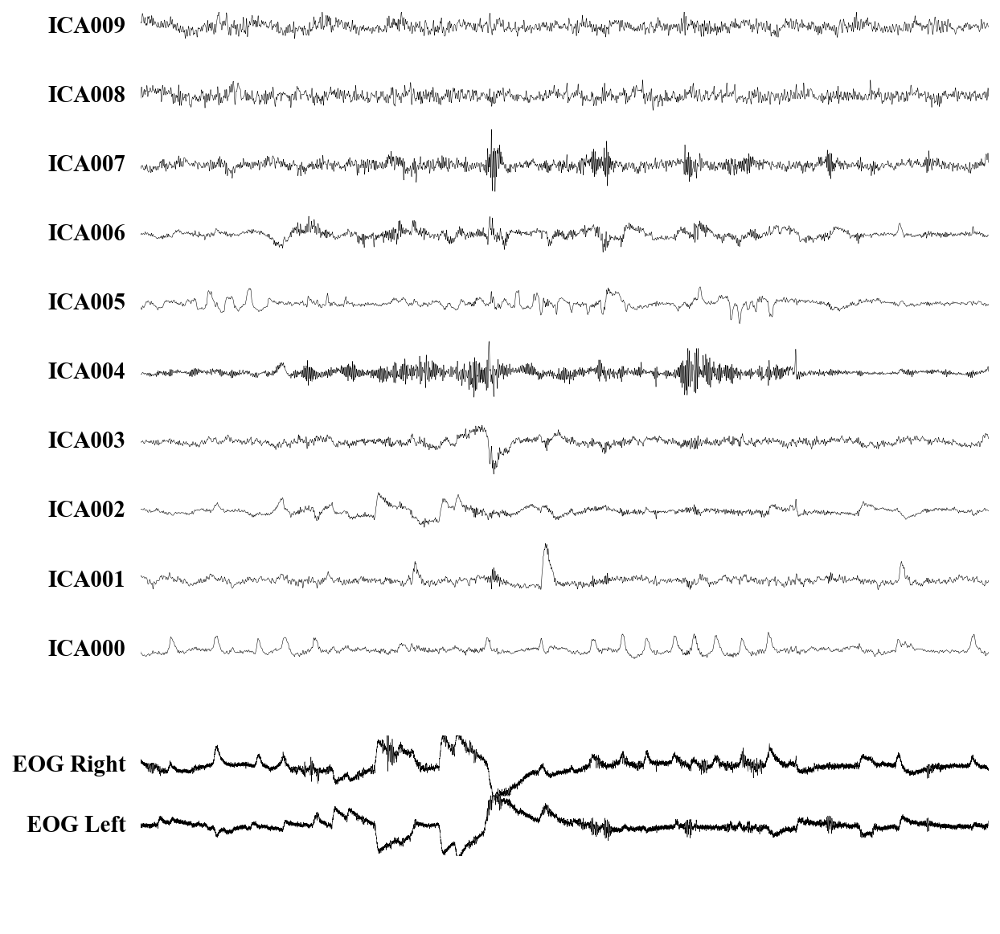

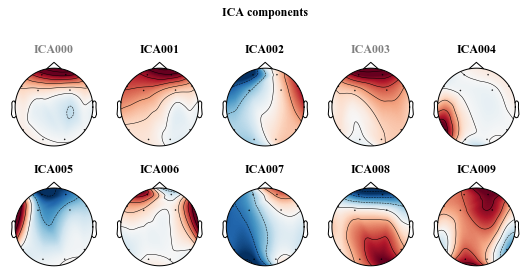

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.3s.
Transforming to ICA space (10 components)
Zeroing out 2 ICA components
4


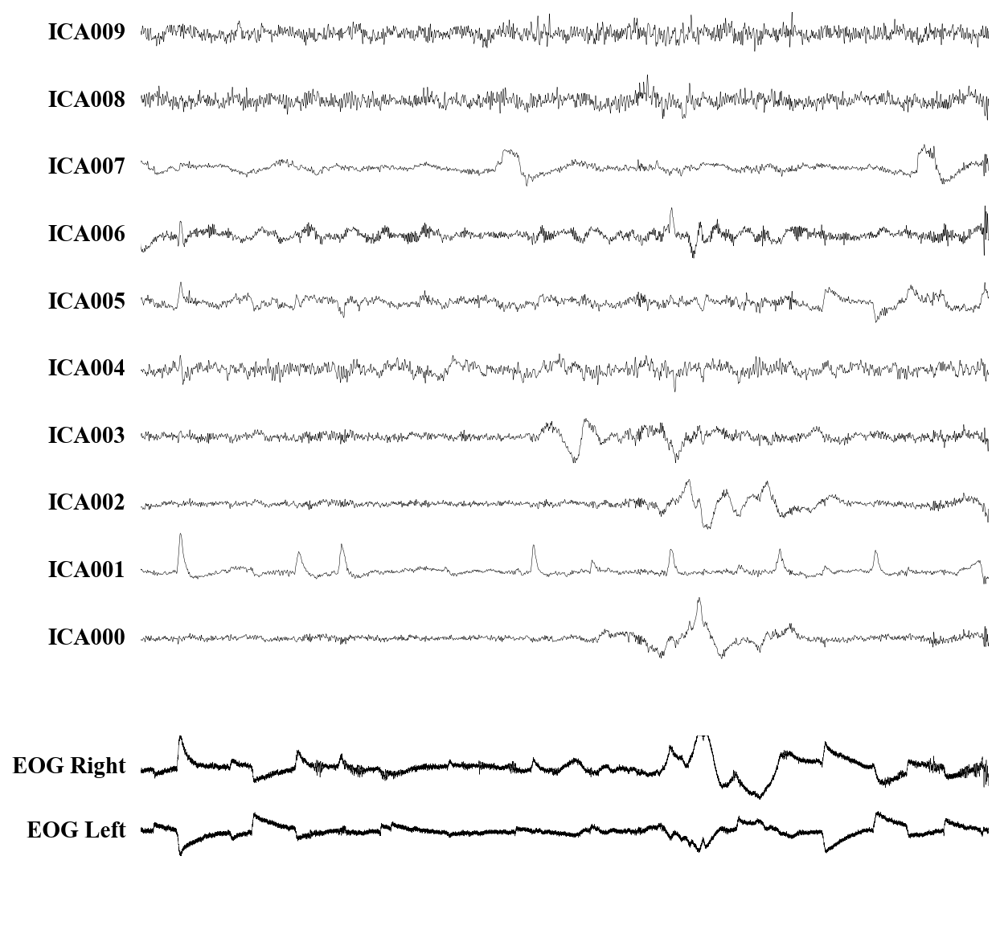

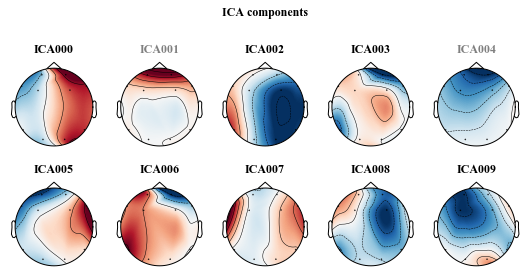

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.3s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
5


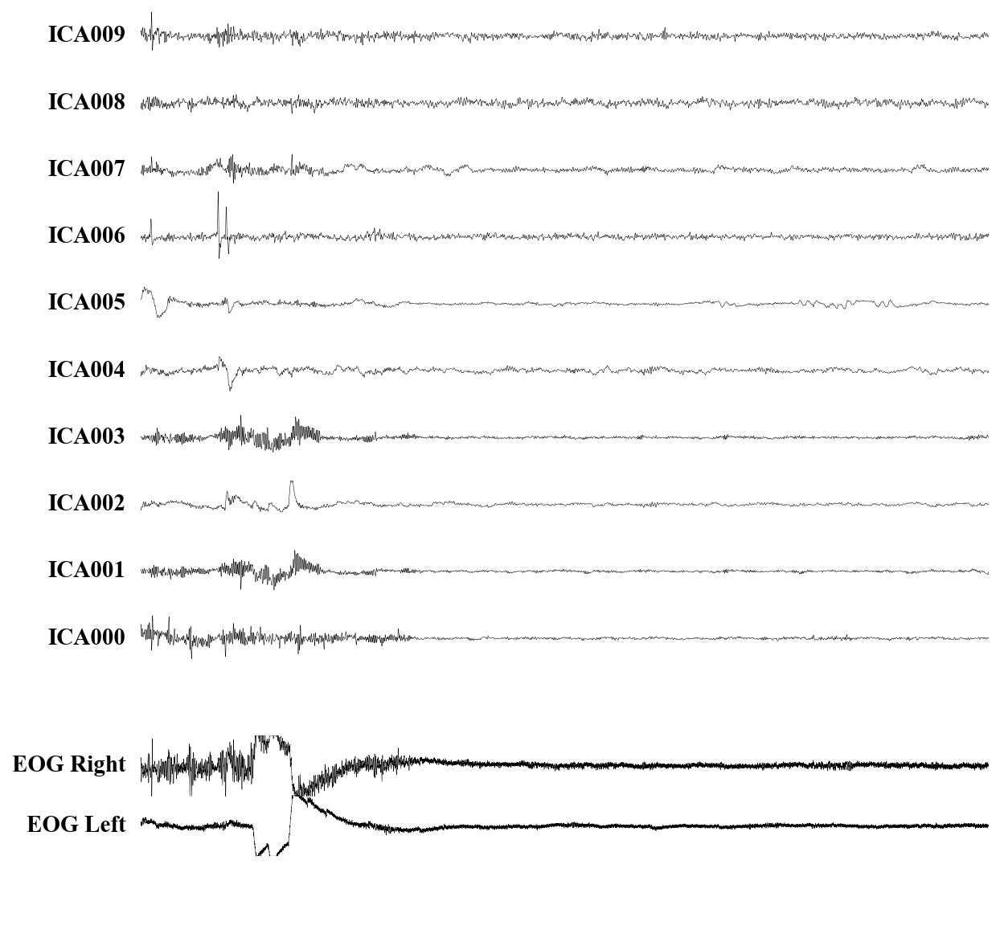

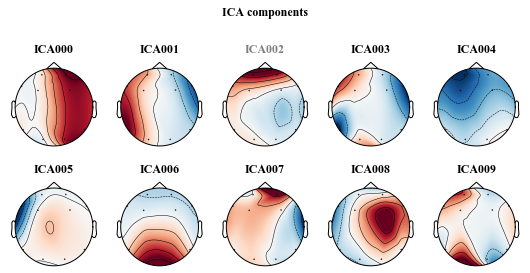

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.5s.
Transforming to ICA space (10 components)
Zeroing out 3 ICA components
6


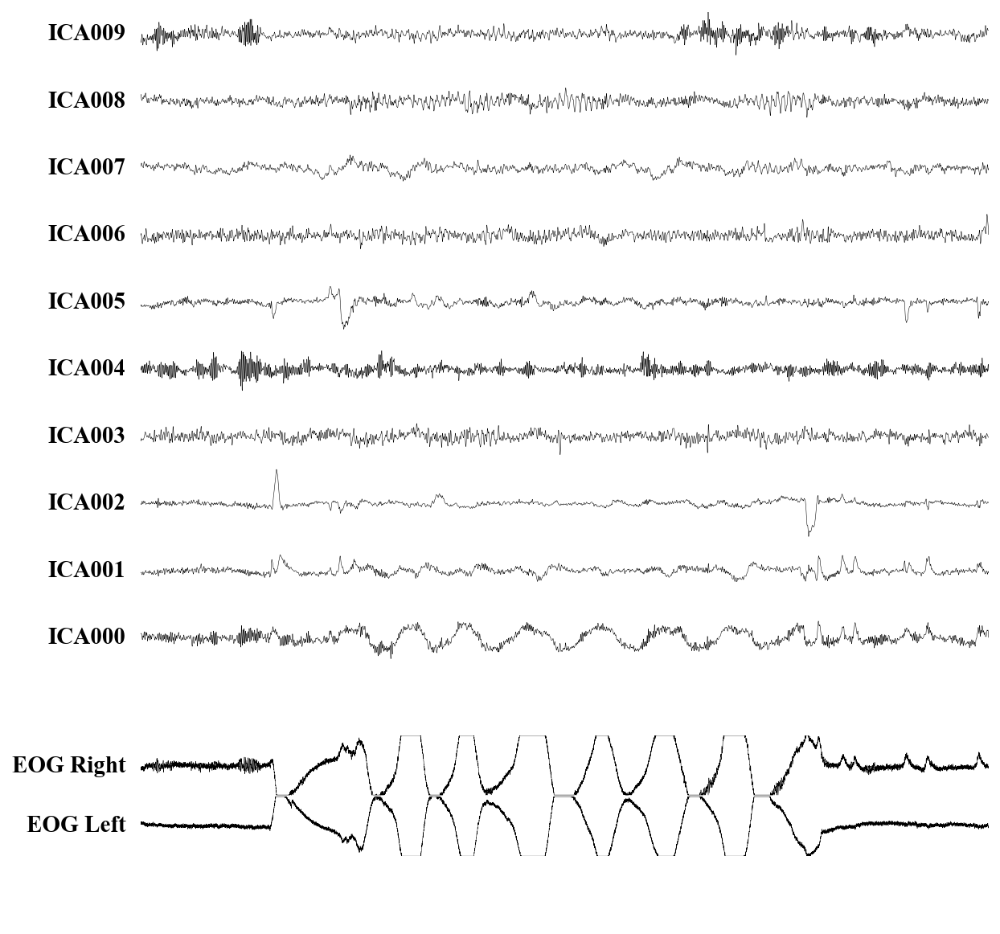

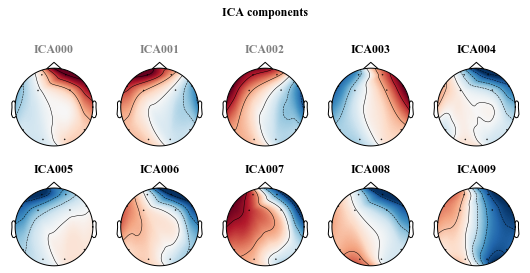

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.4s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
7


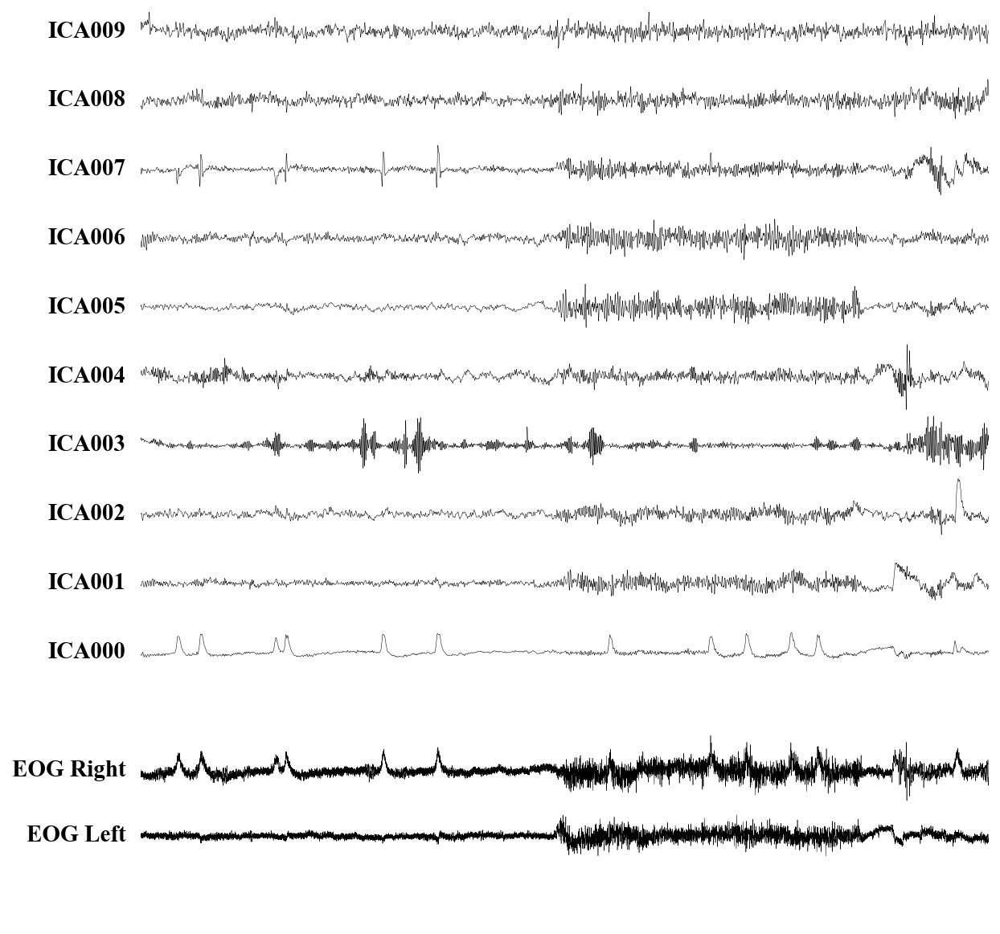

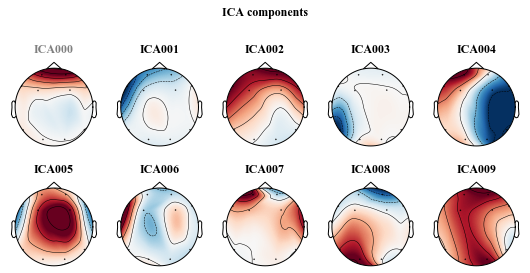

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.3s.
Transforming to ICA space (10 components)
Zeroing out 2 ICA components
8


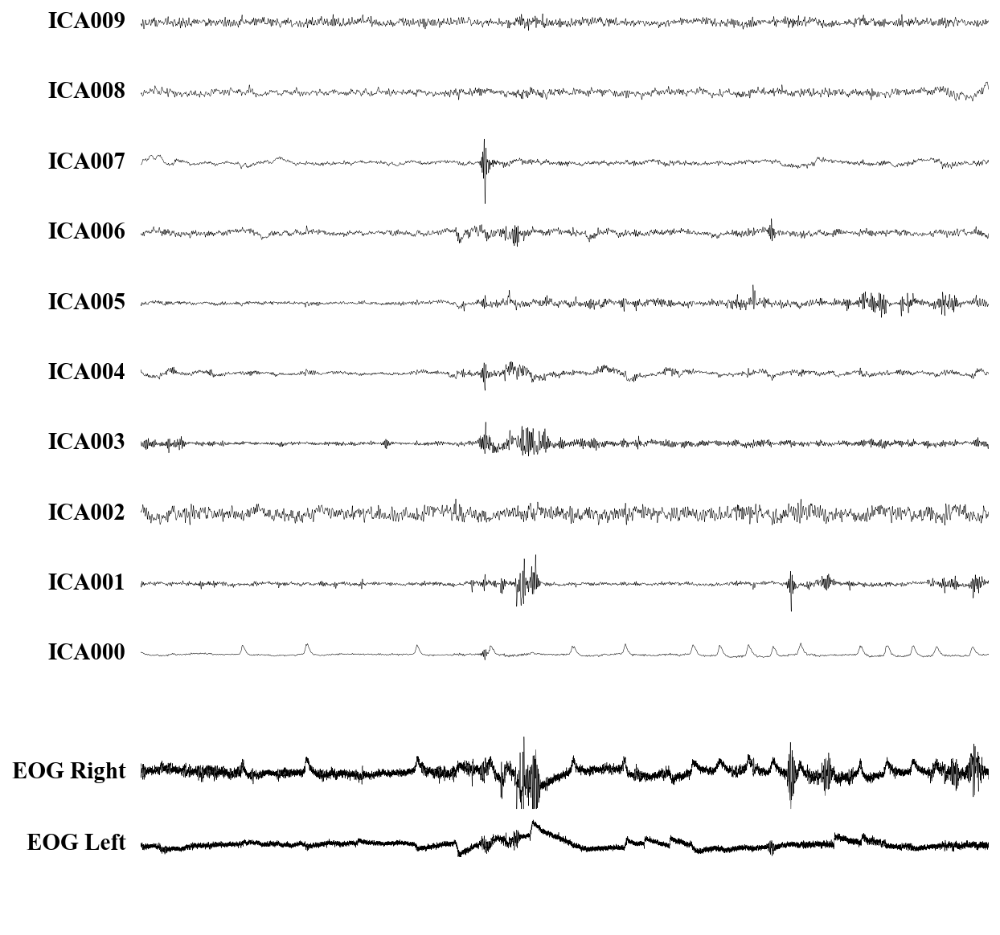

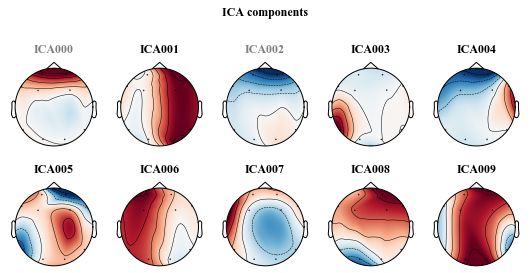

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.6s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
9


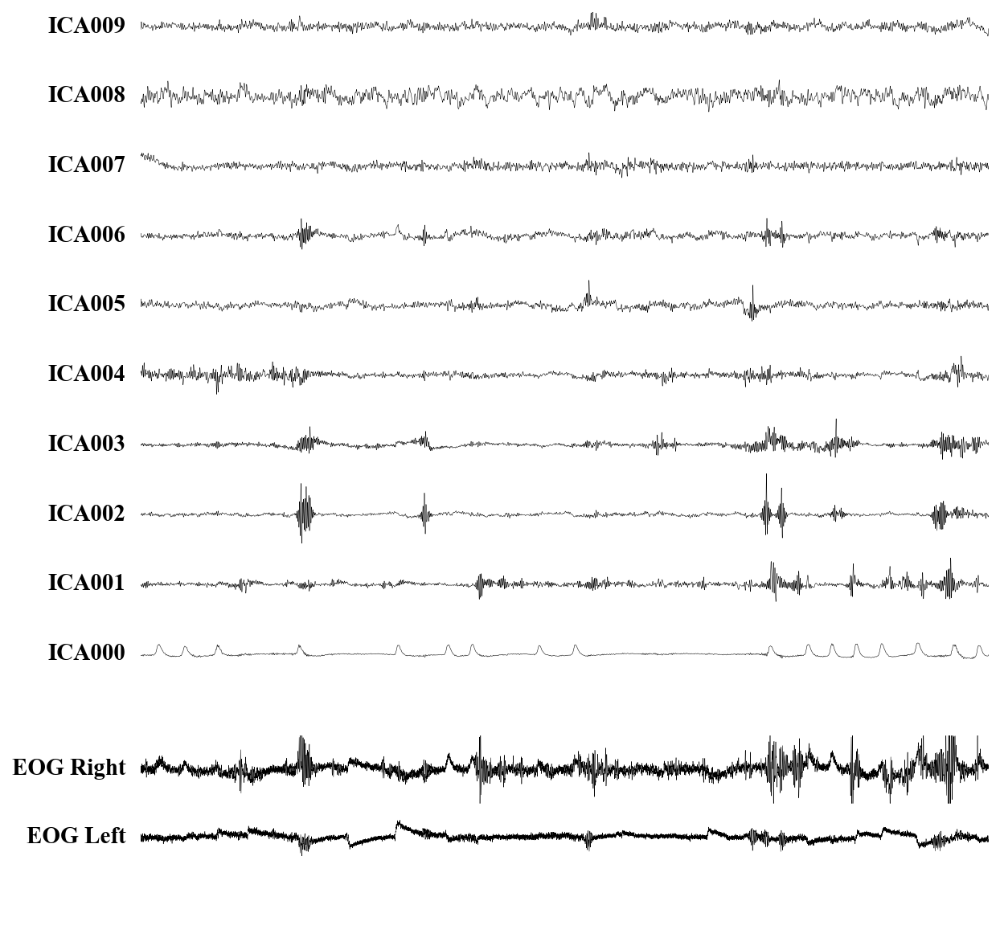

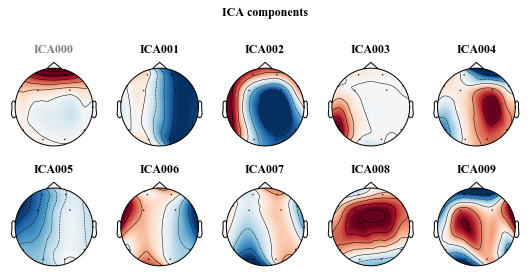

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.9s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
10


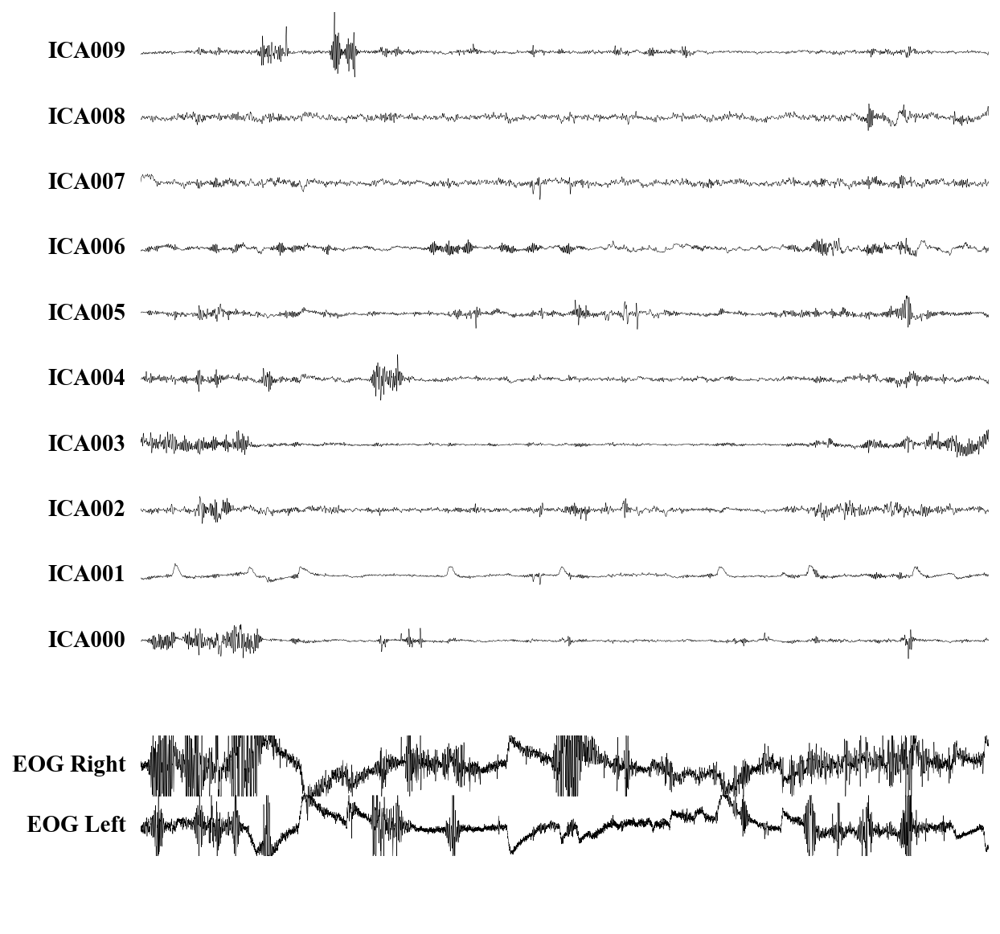

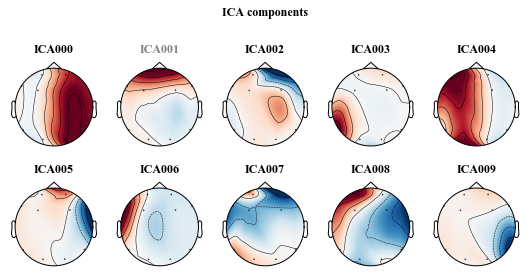

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.4s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
11


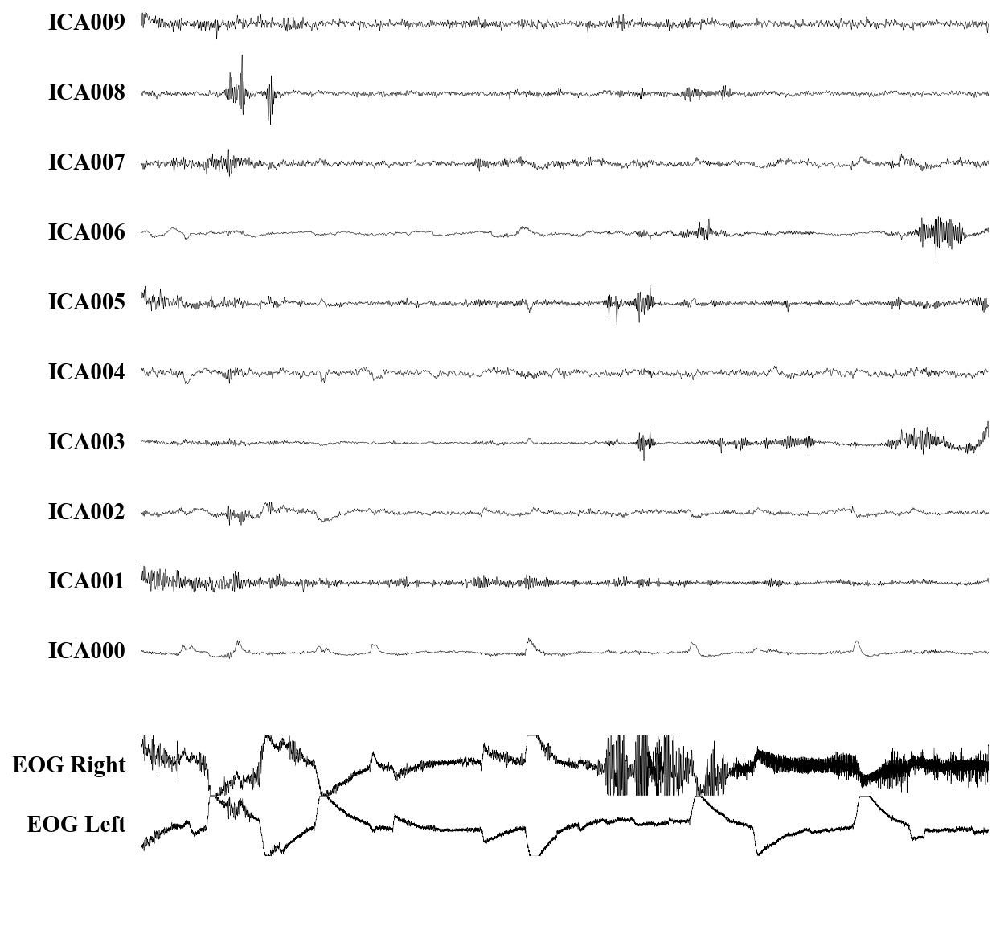

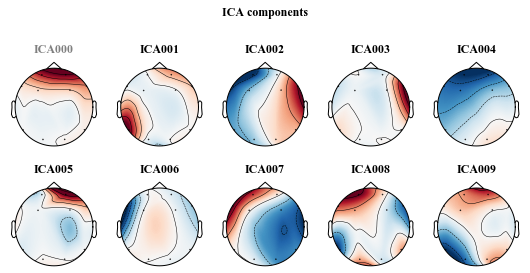

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.2s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
12


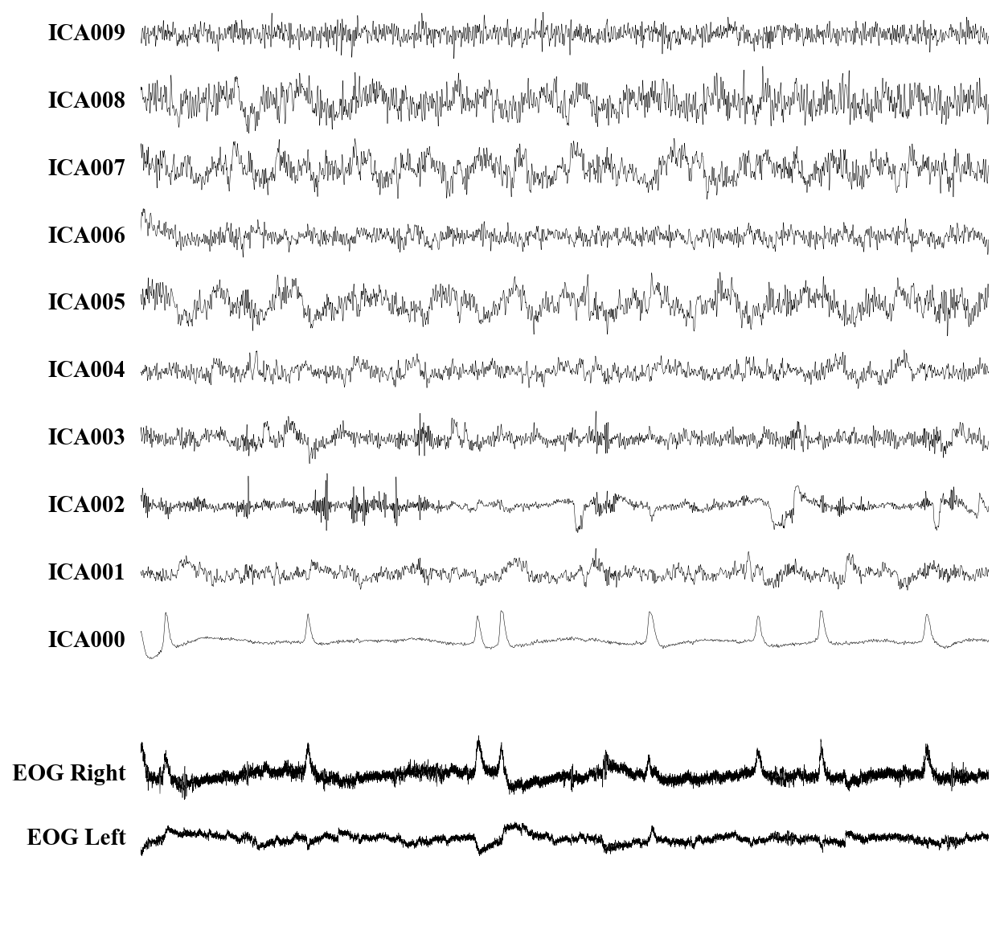

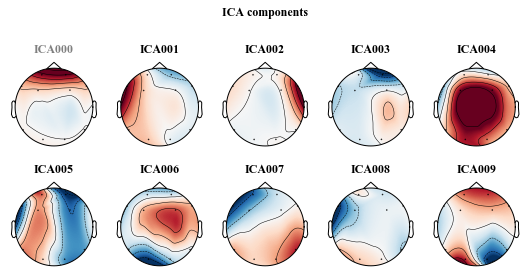

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.3s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
13


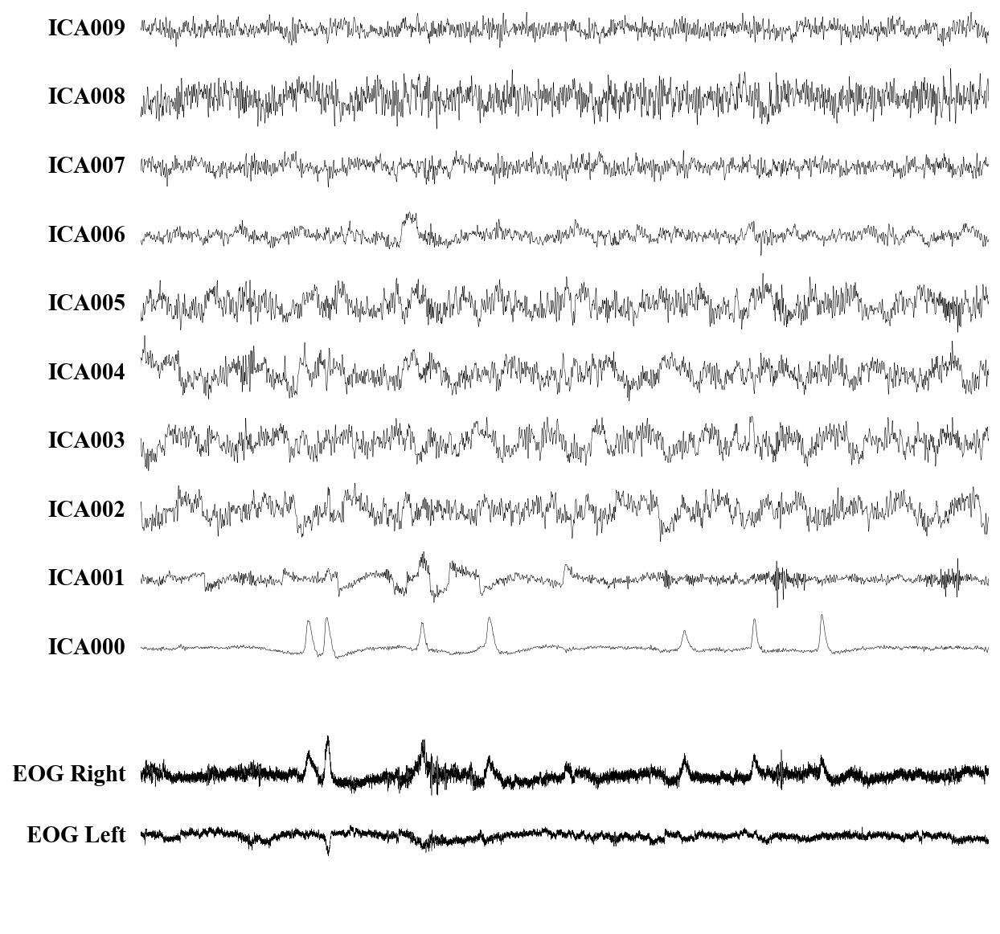

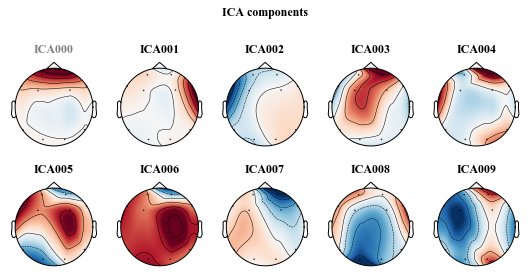

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.7s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
14


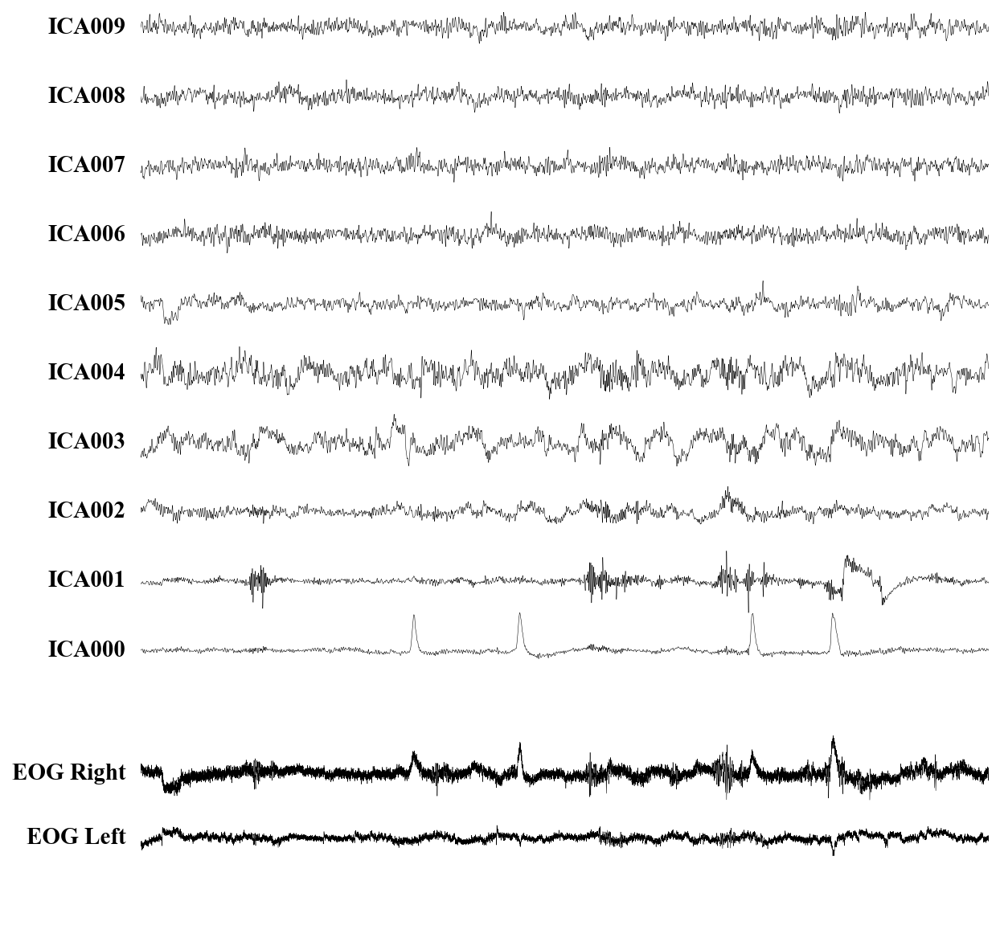

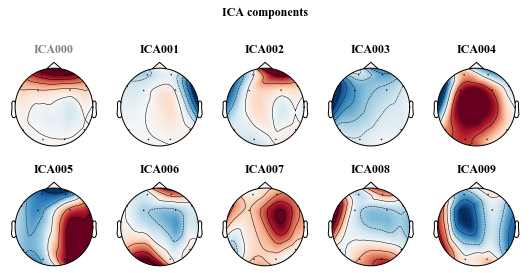

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.2s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
15


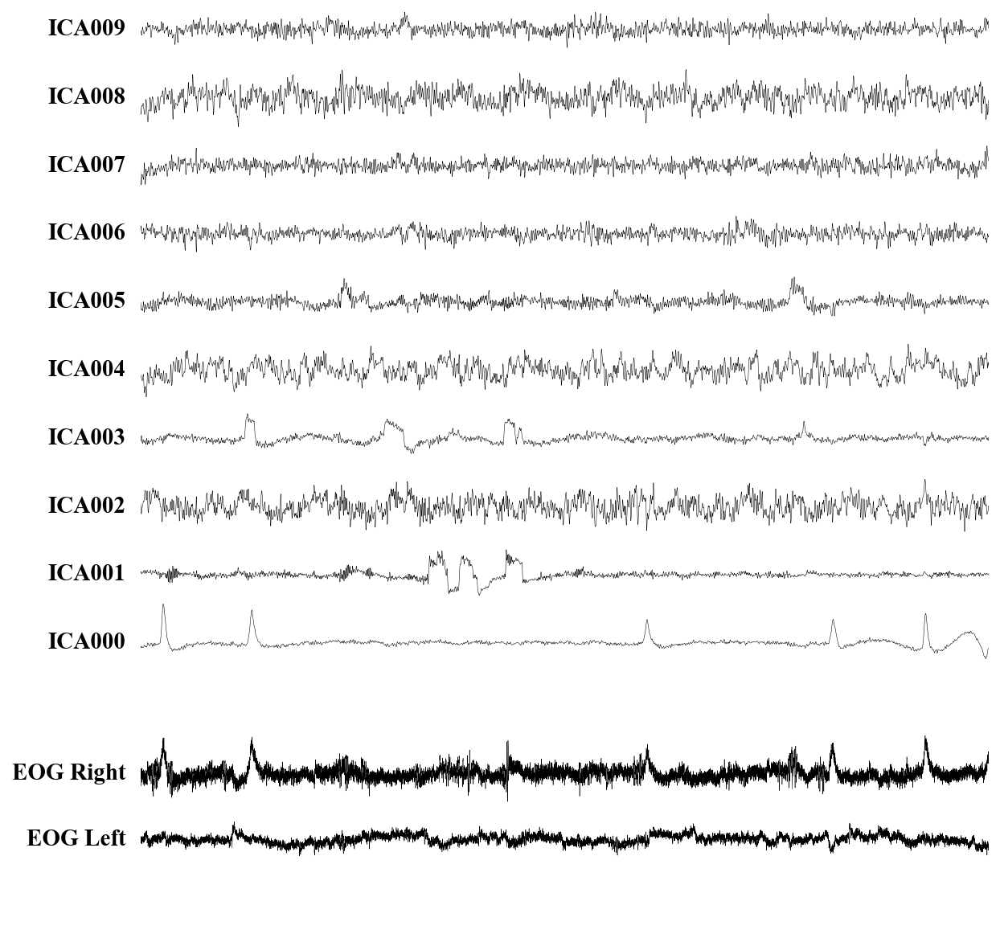

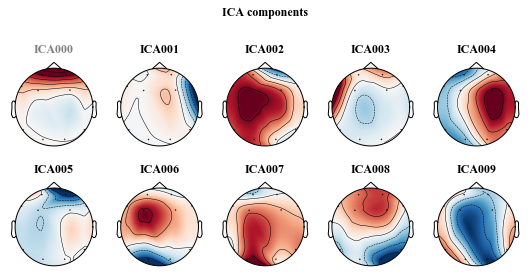

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.6s.
Transforming to ICA space (10 components)
Zeroing out 2 ICA components
16


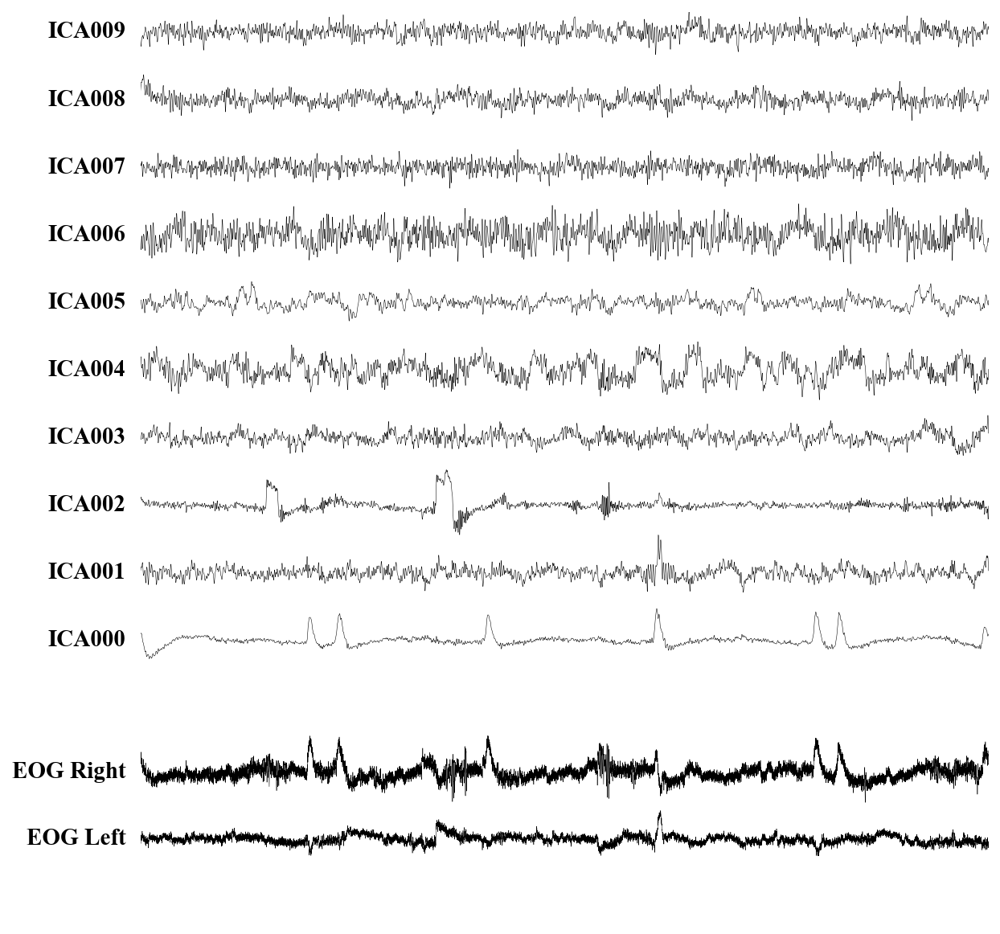

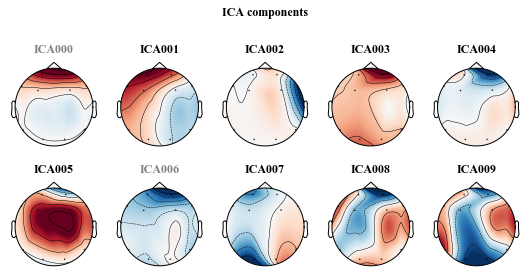

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.3s.
Transforming to ICA space (10 components)
Zeroing out 2 ICA components
17


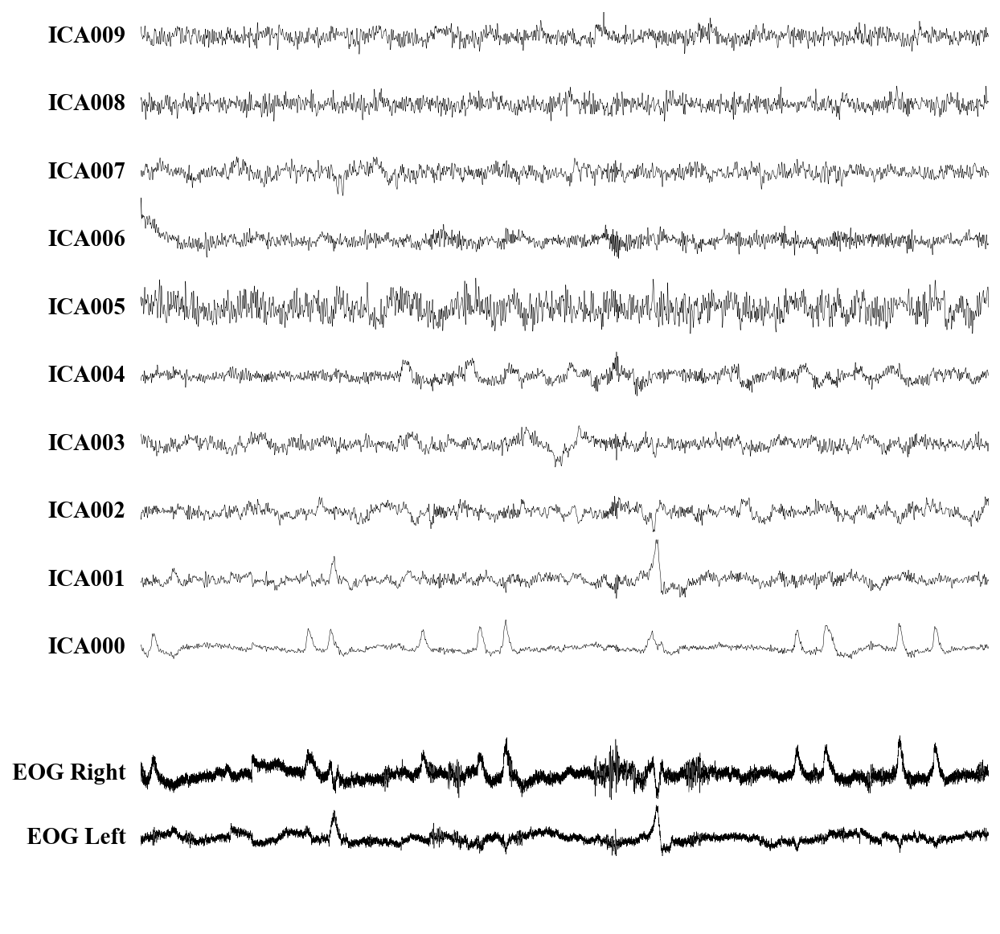

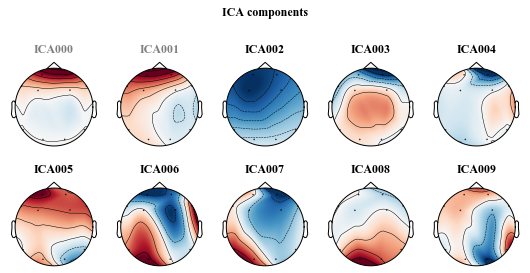

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.1s.
Transforming to ICA space (10 components)
Zeroing out 2 ICA components
18


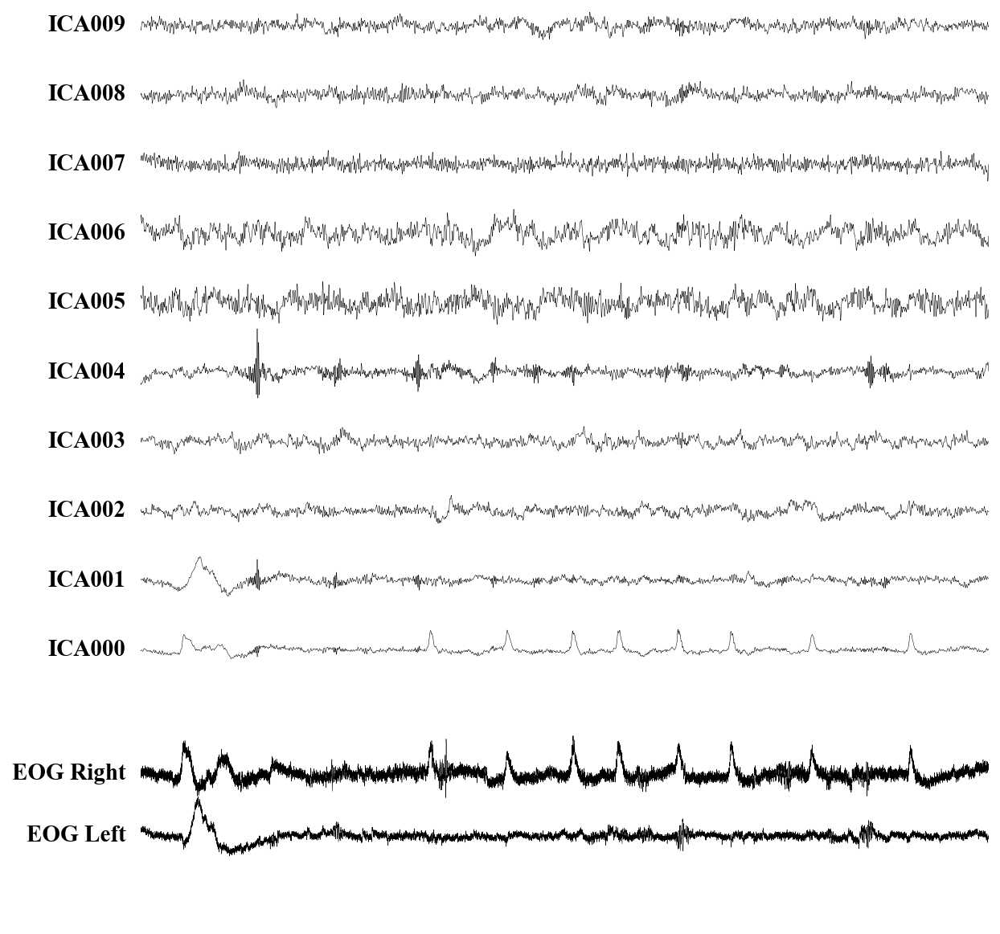

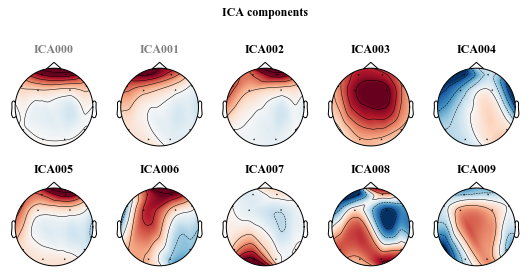

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.2s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
19


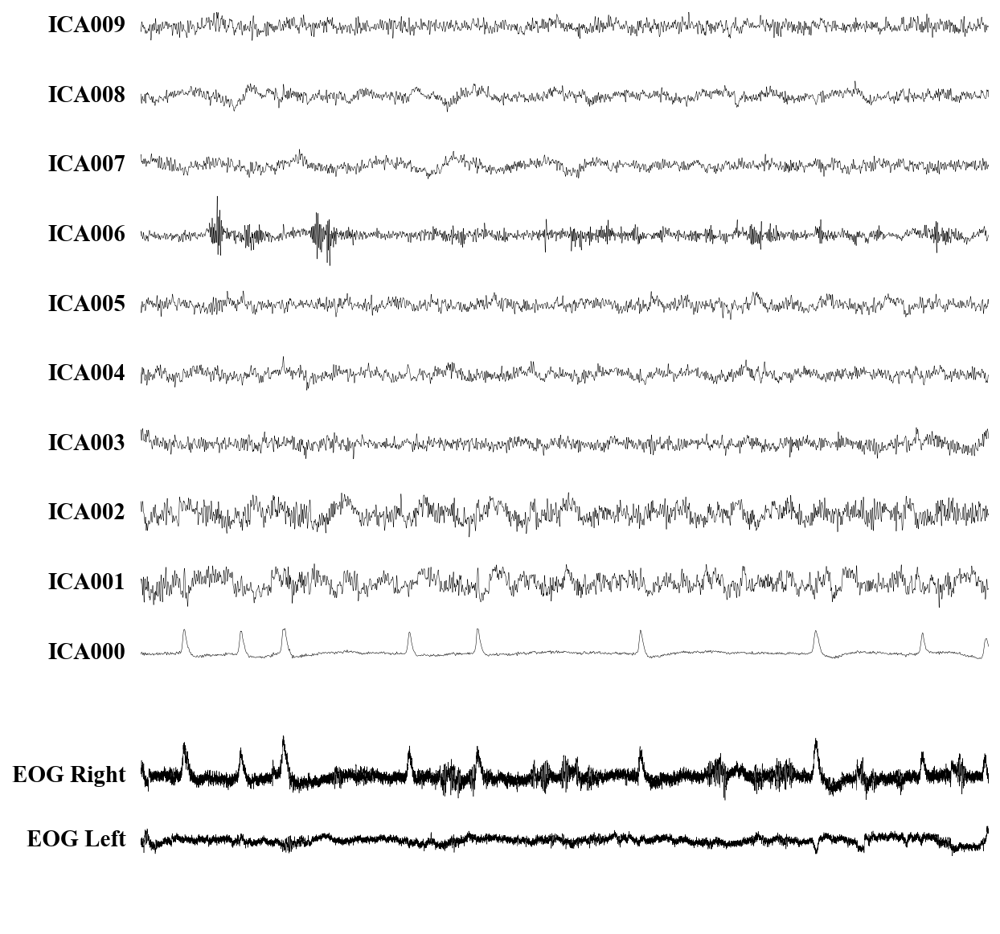

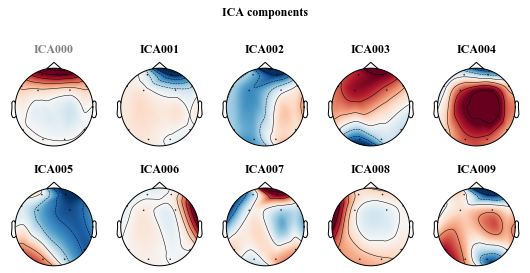

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.3s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
20


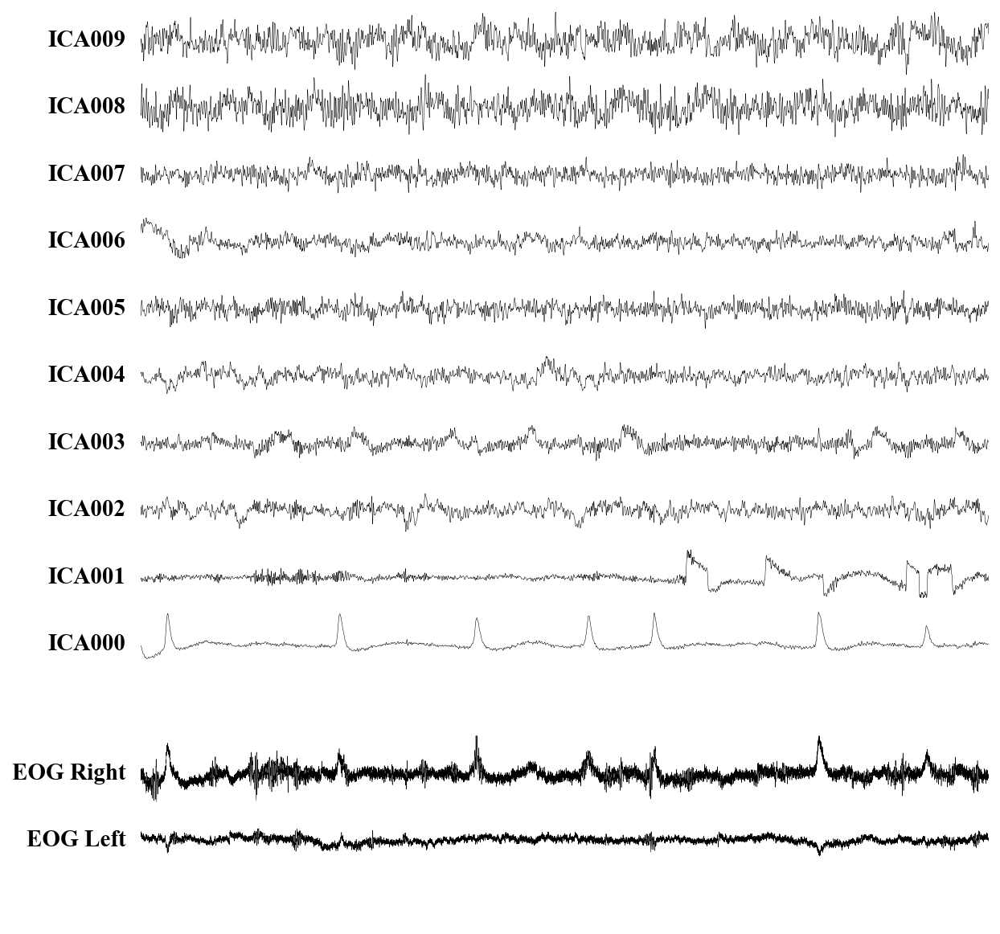

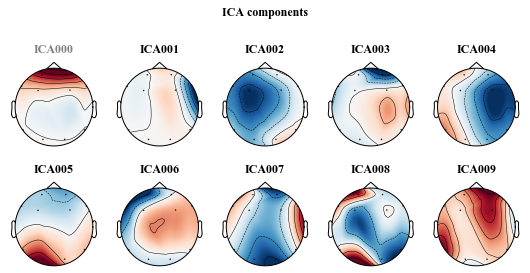

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.1s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
21


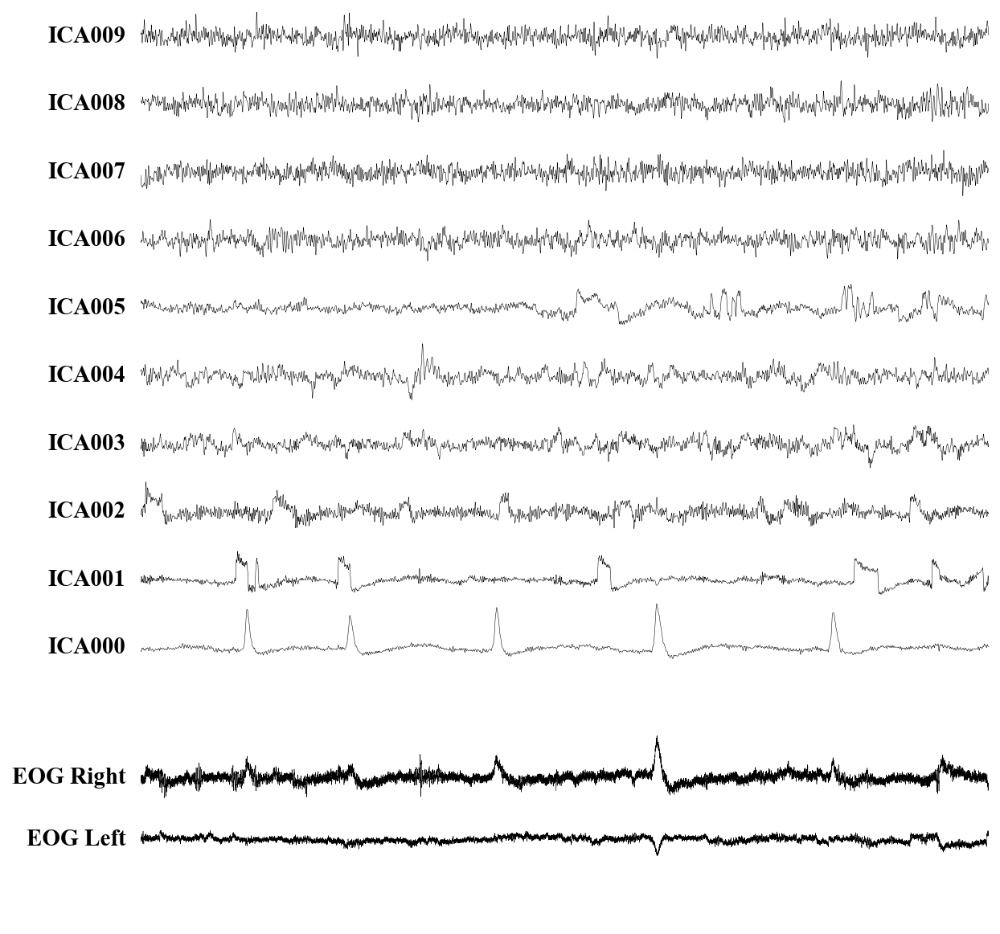

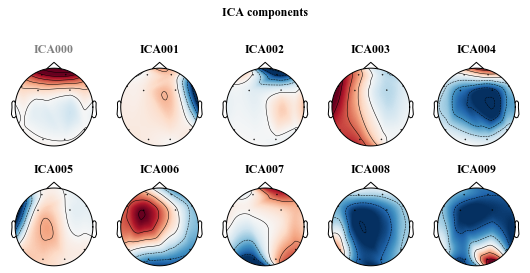

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 2.2s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
22


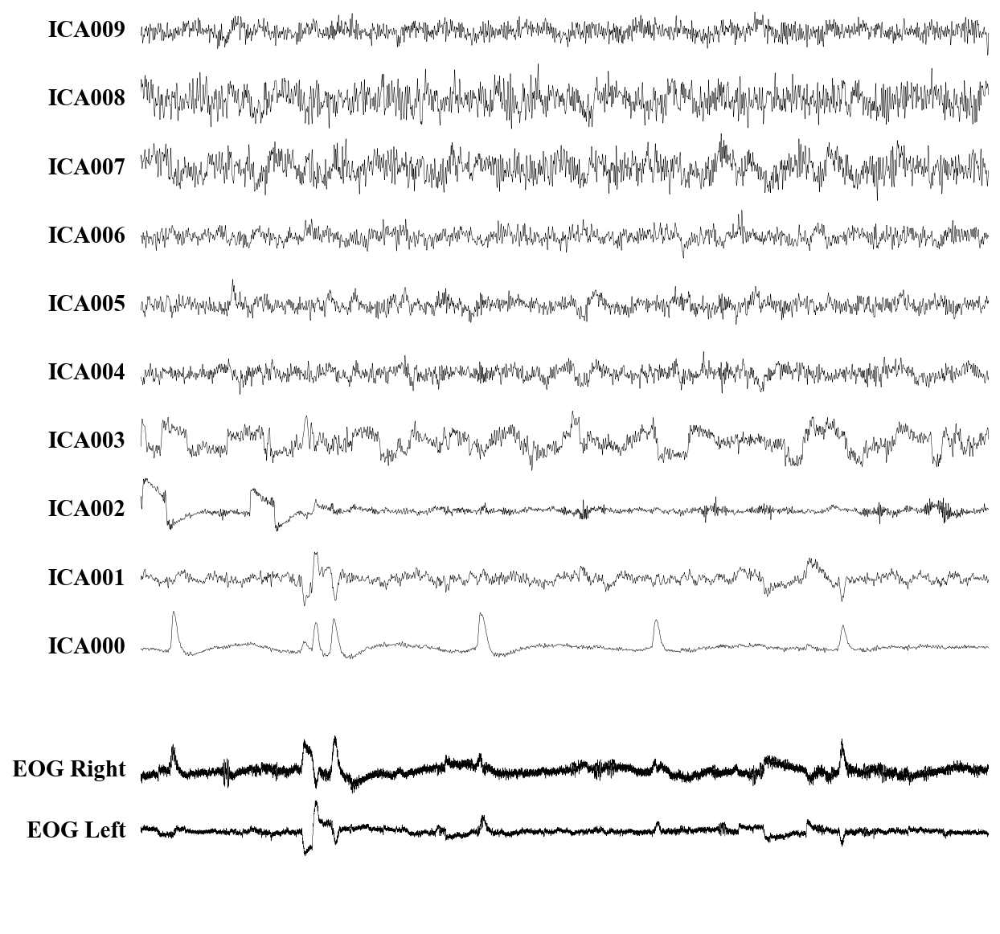

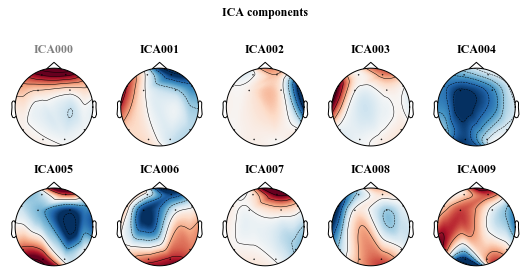

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.4s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
23


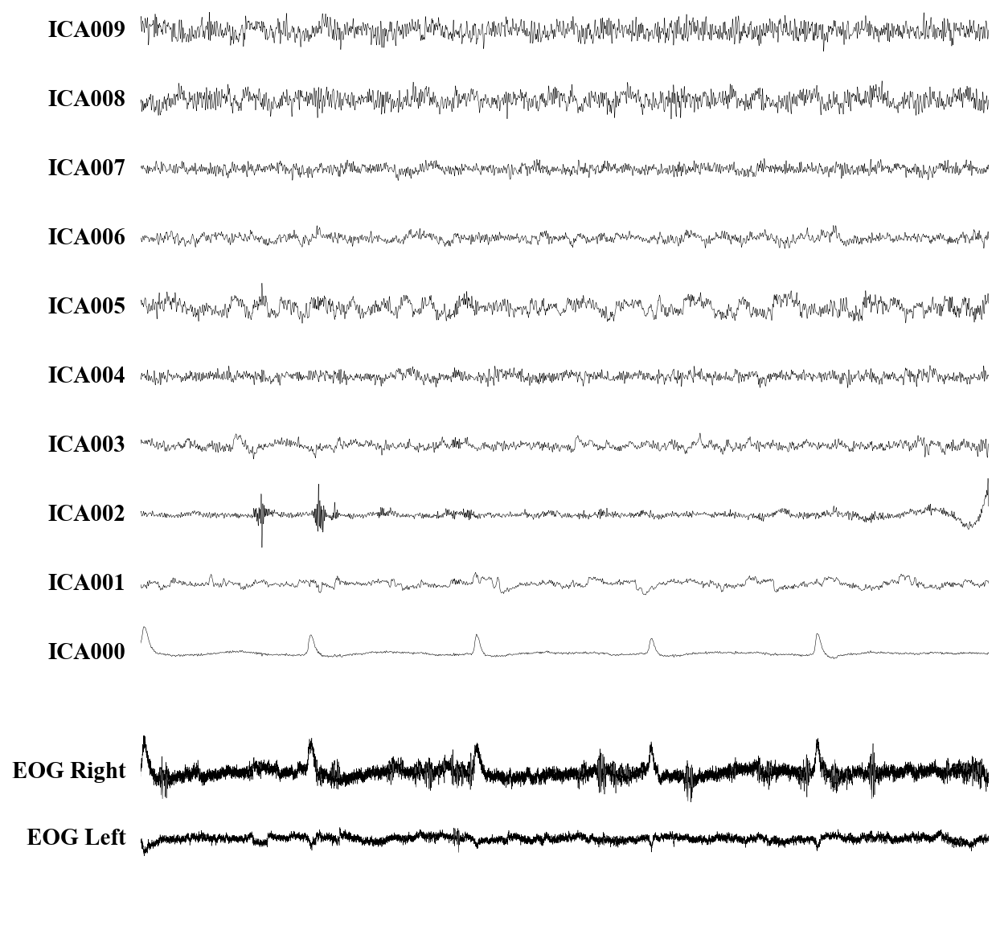

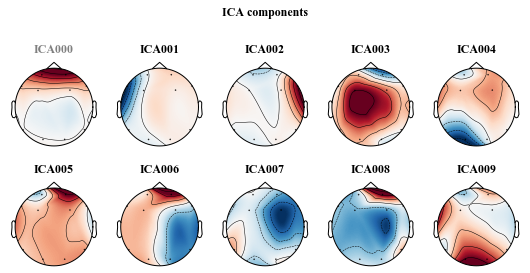

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.5s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
24


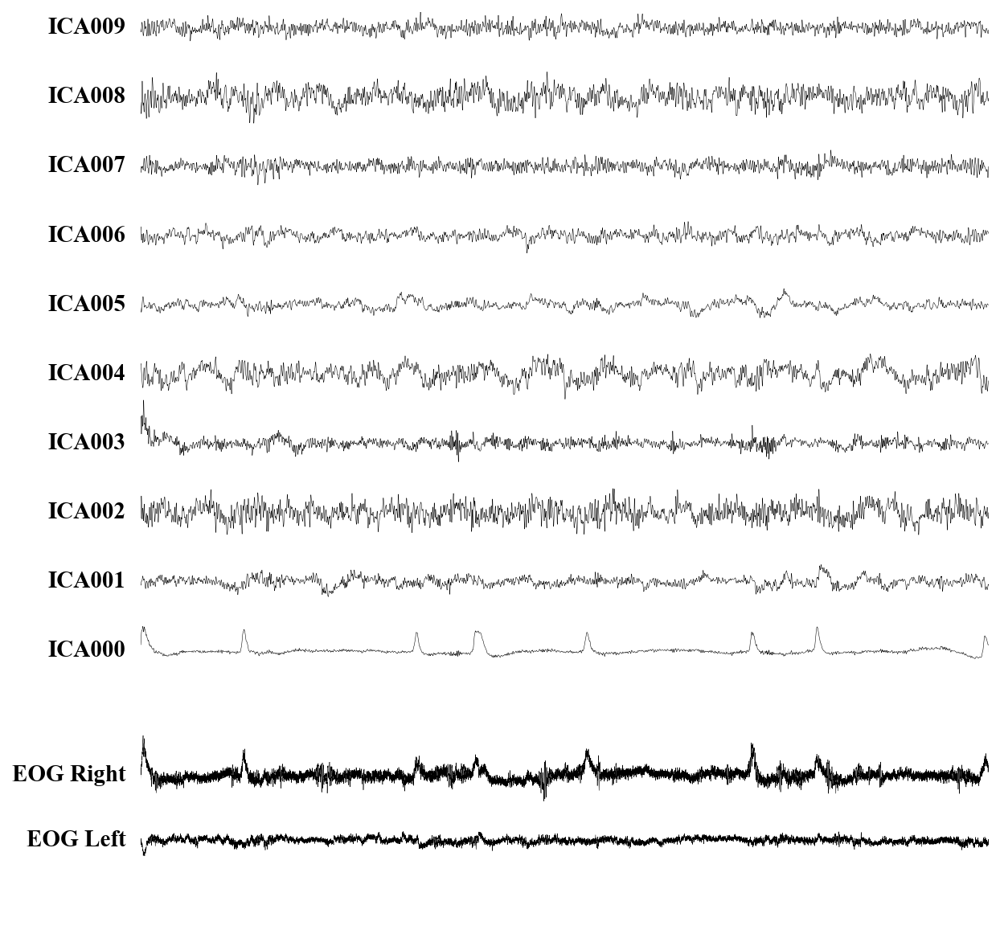

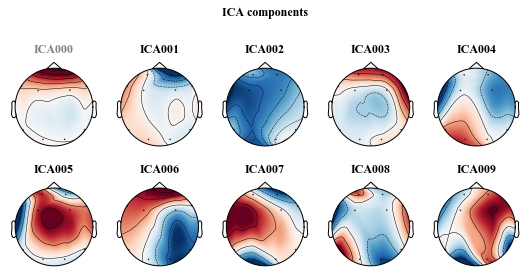

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.4s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
25


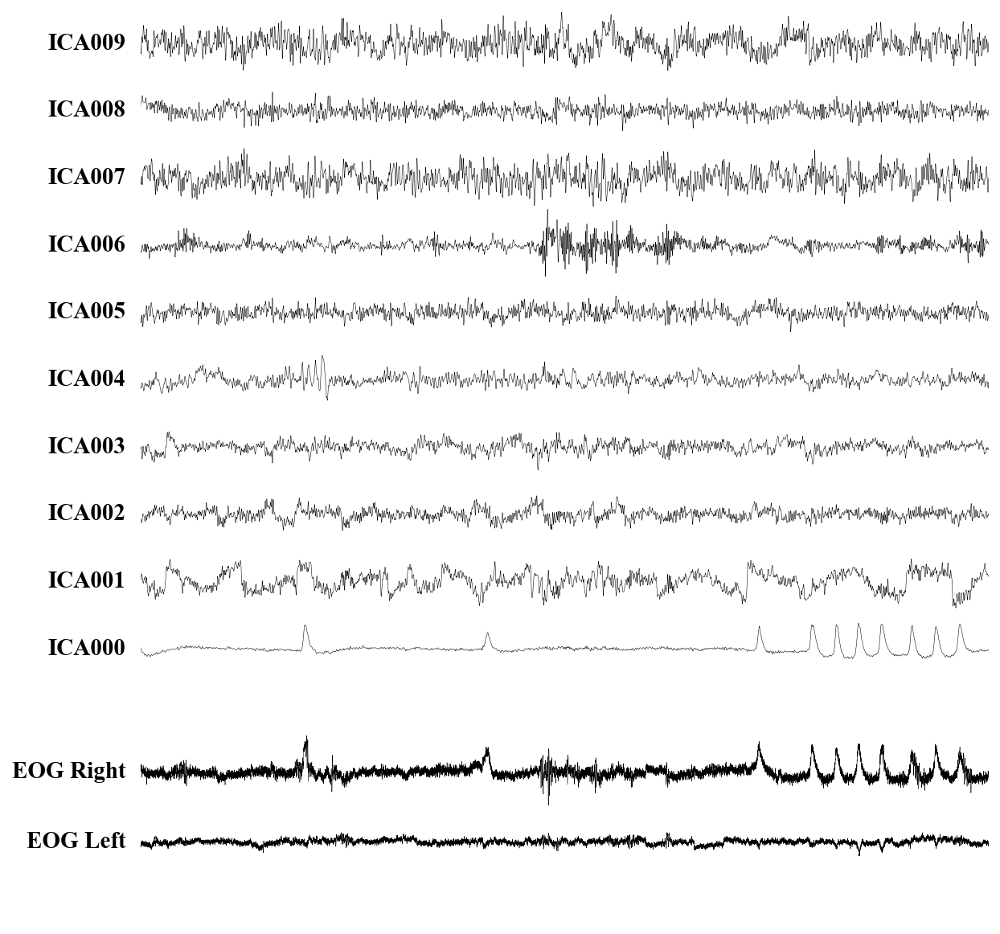

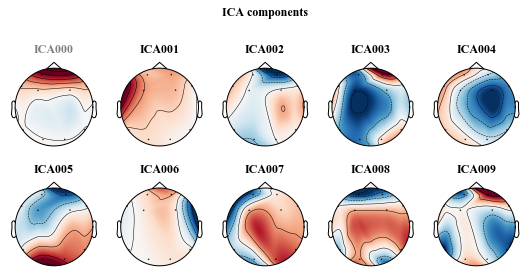

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.2s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
26


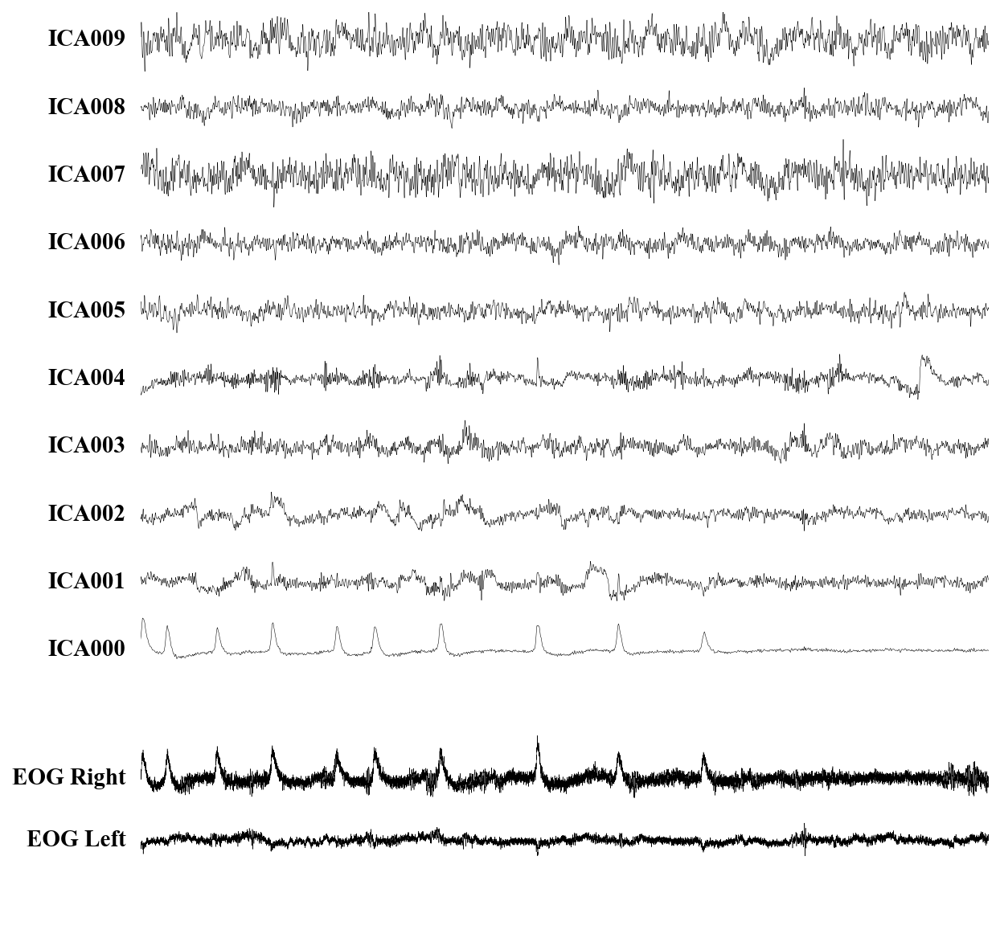

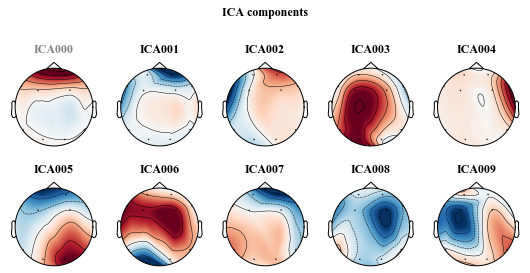

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.3s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
27


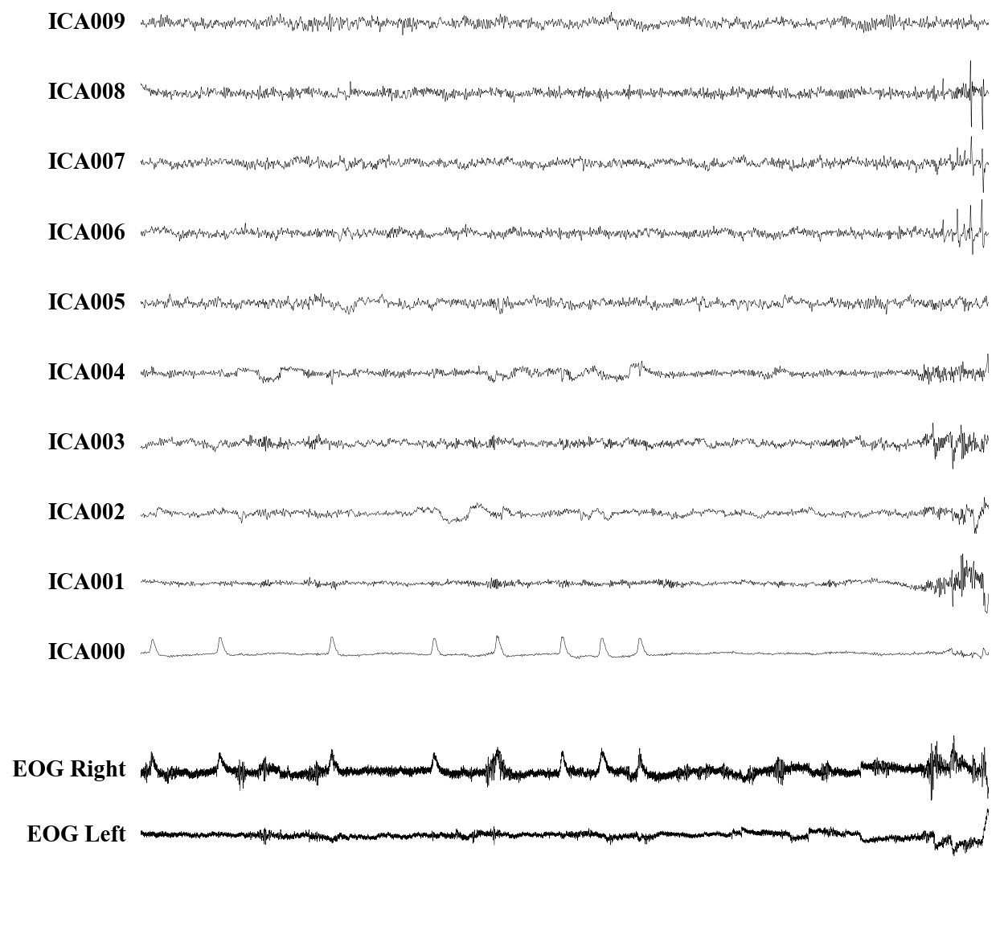

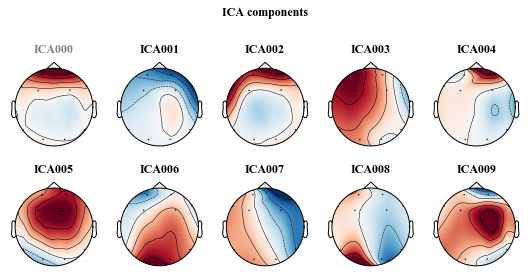

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.5s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
28


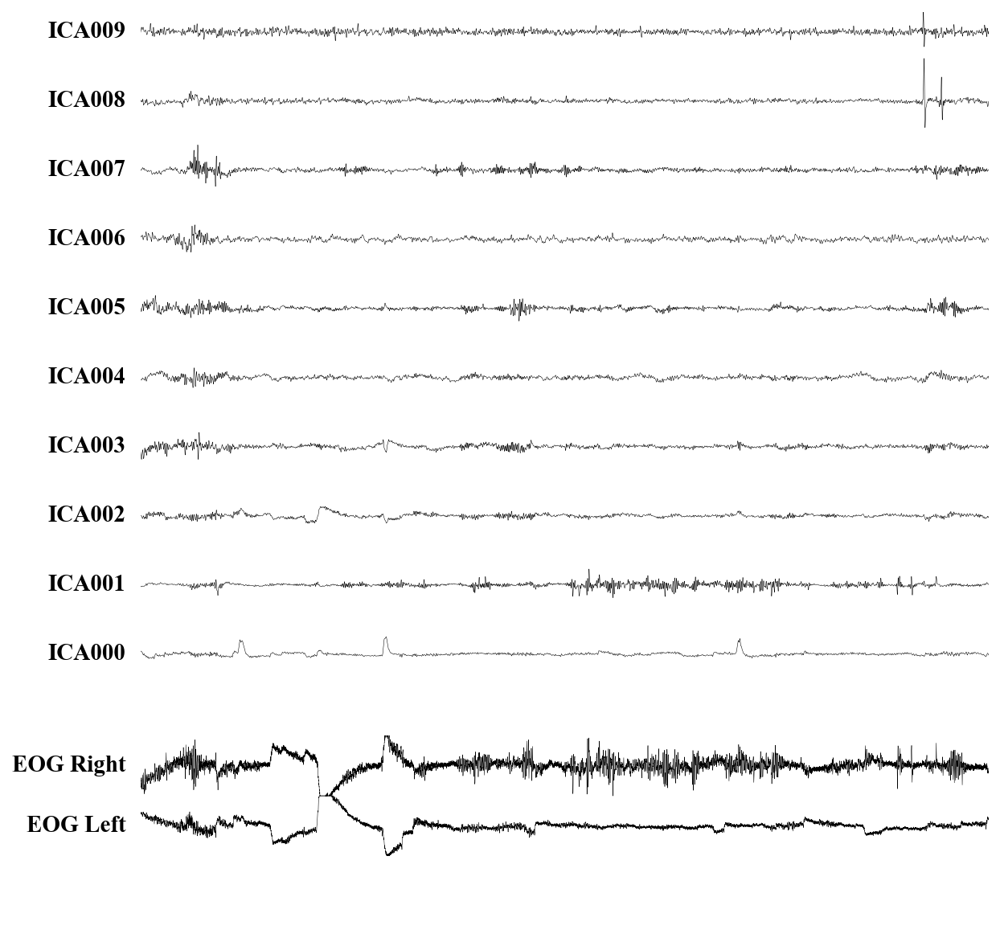

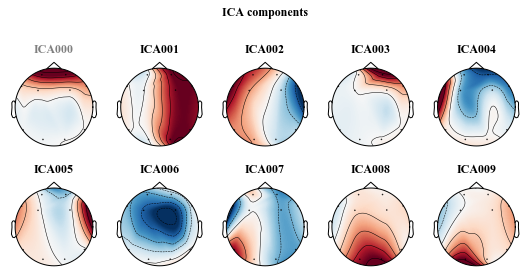

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.0s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
29


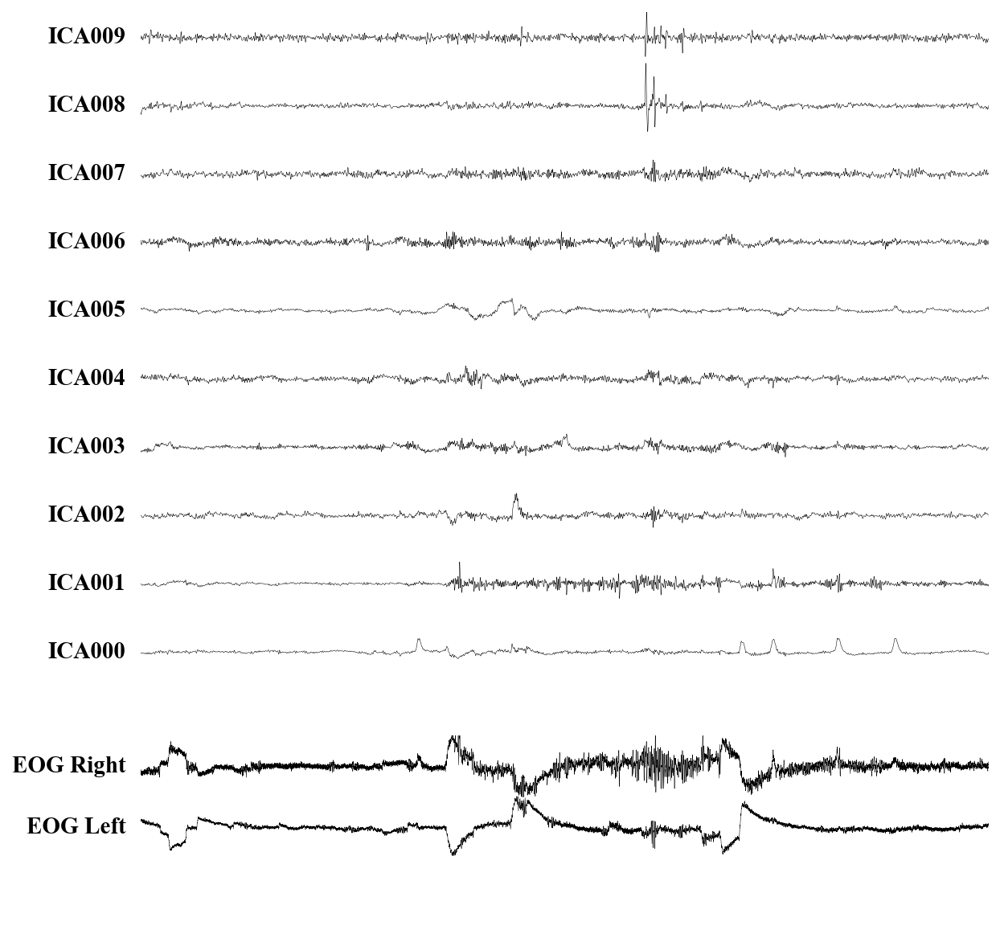

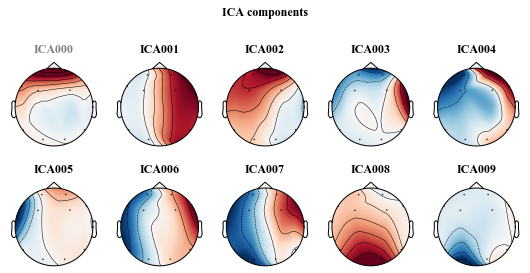

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.6s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
30


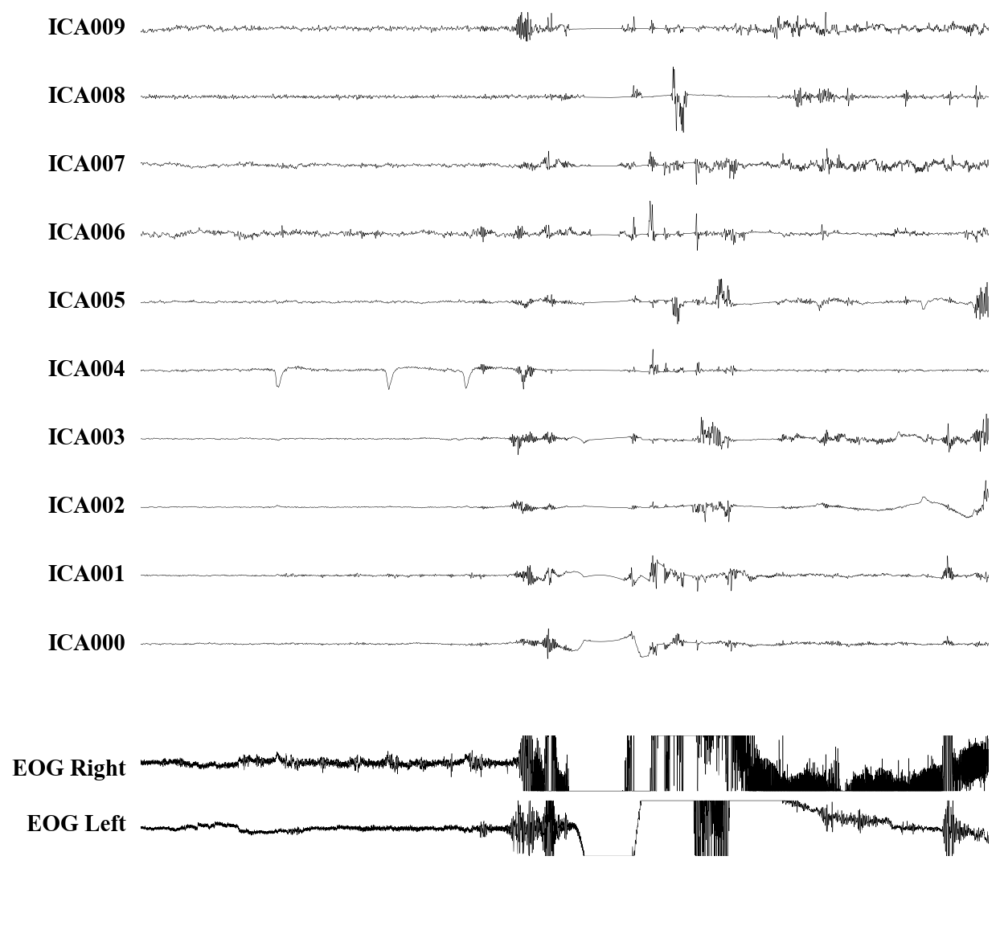

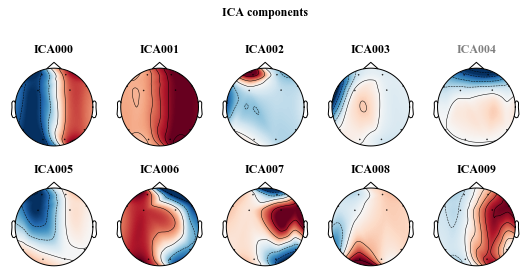

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.4s.
Transforming to ICA space (10 components)
Zeroing out 0 ICA components
31


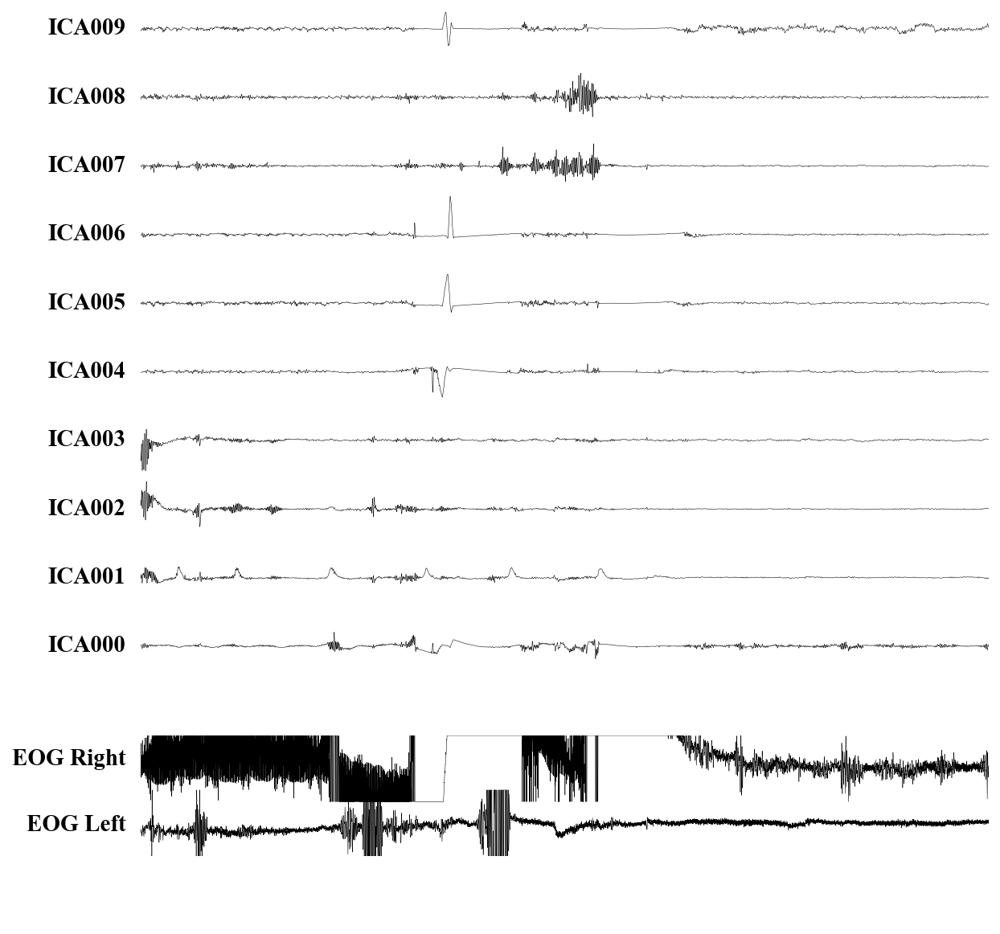

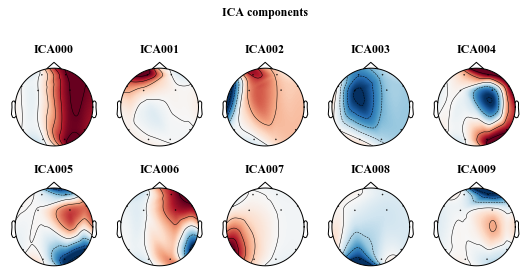

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.3s.
Transforming to ICA space (10 components)
Zeroing out 0 ICA components
32


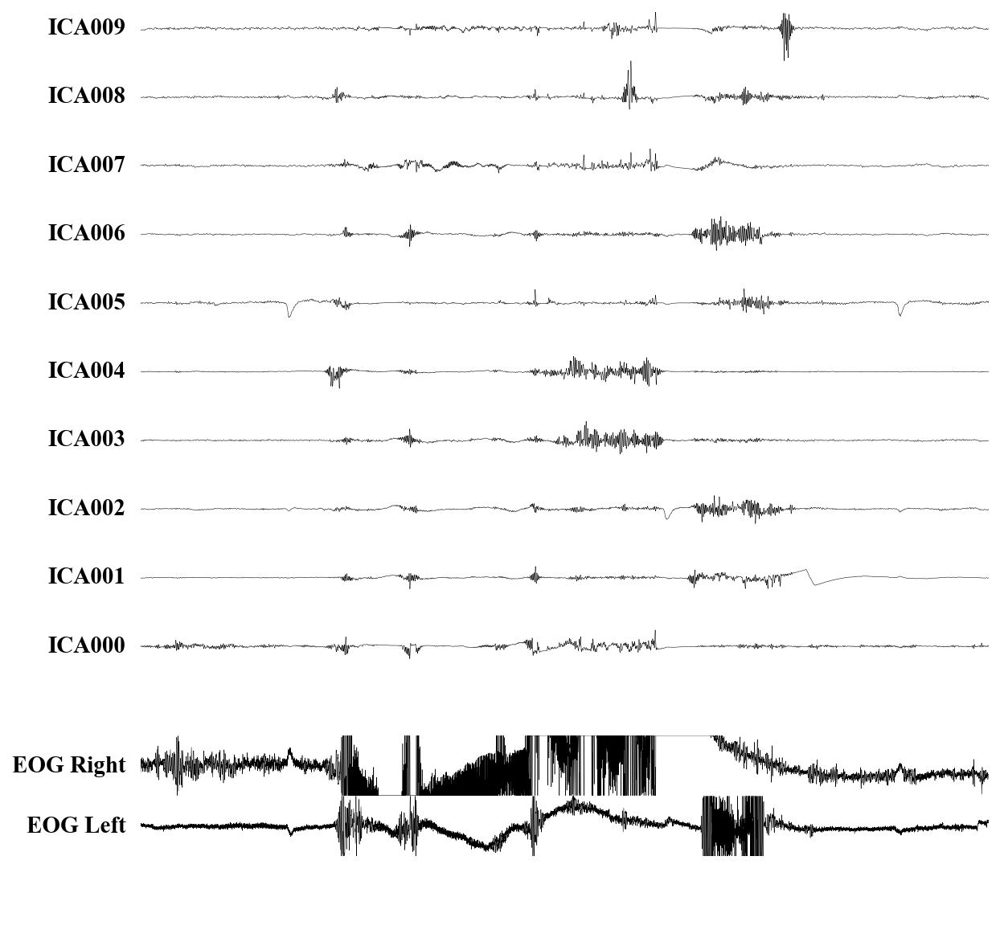

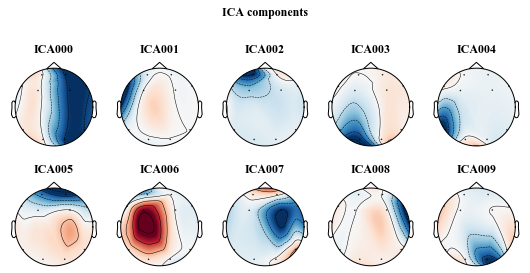

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.5s.
Transforming to ICA space (10 components)
Zeroing out 0 ICA components
33


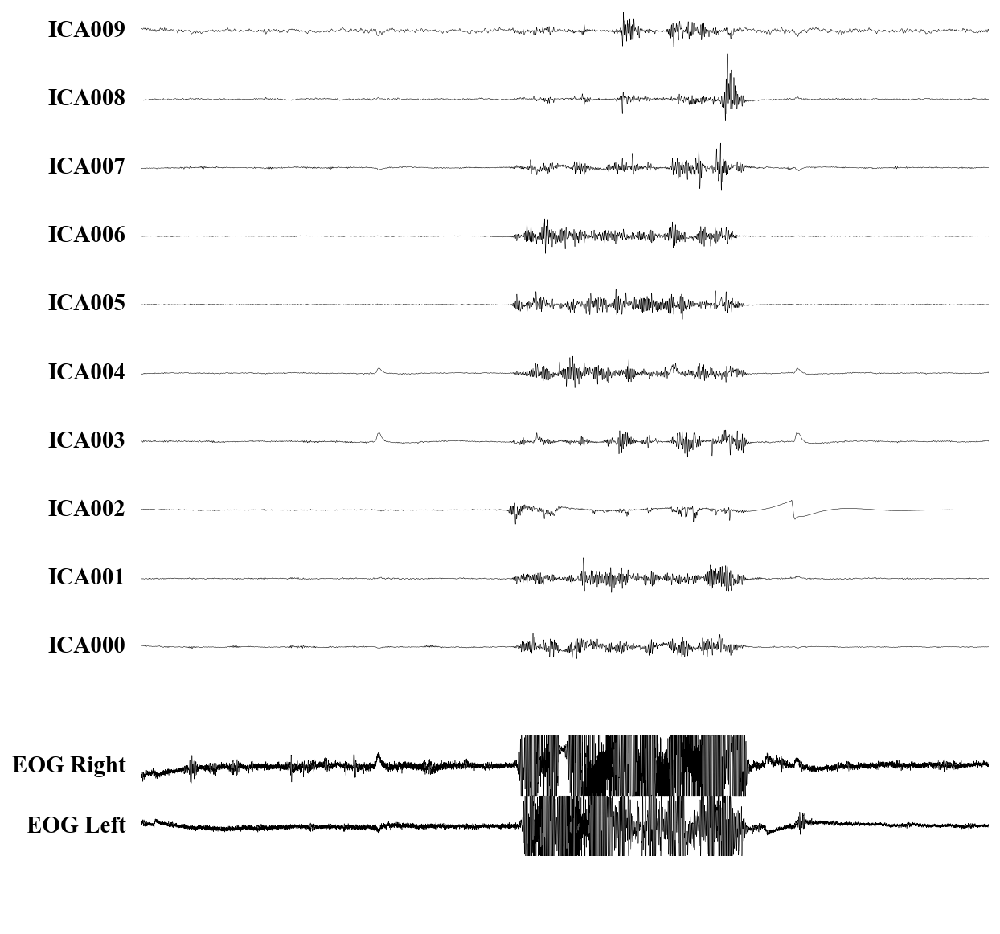

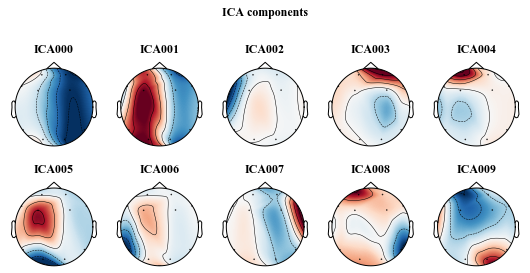

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.7s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
34


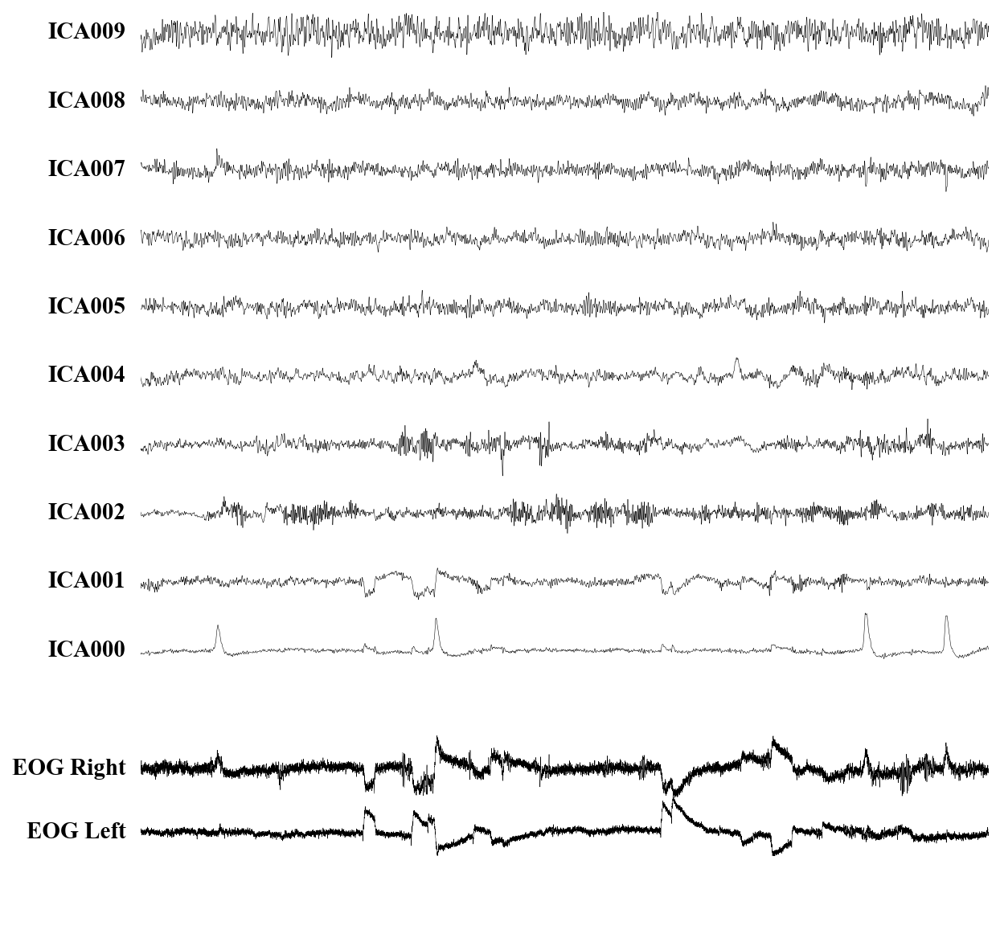

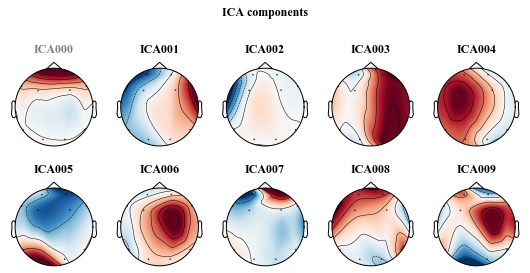

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.0s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
35


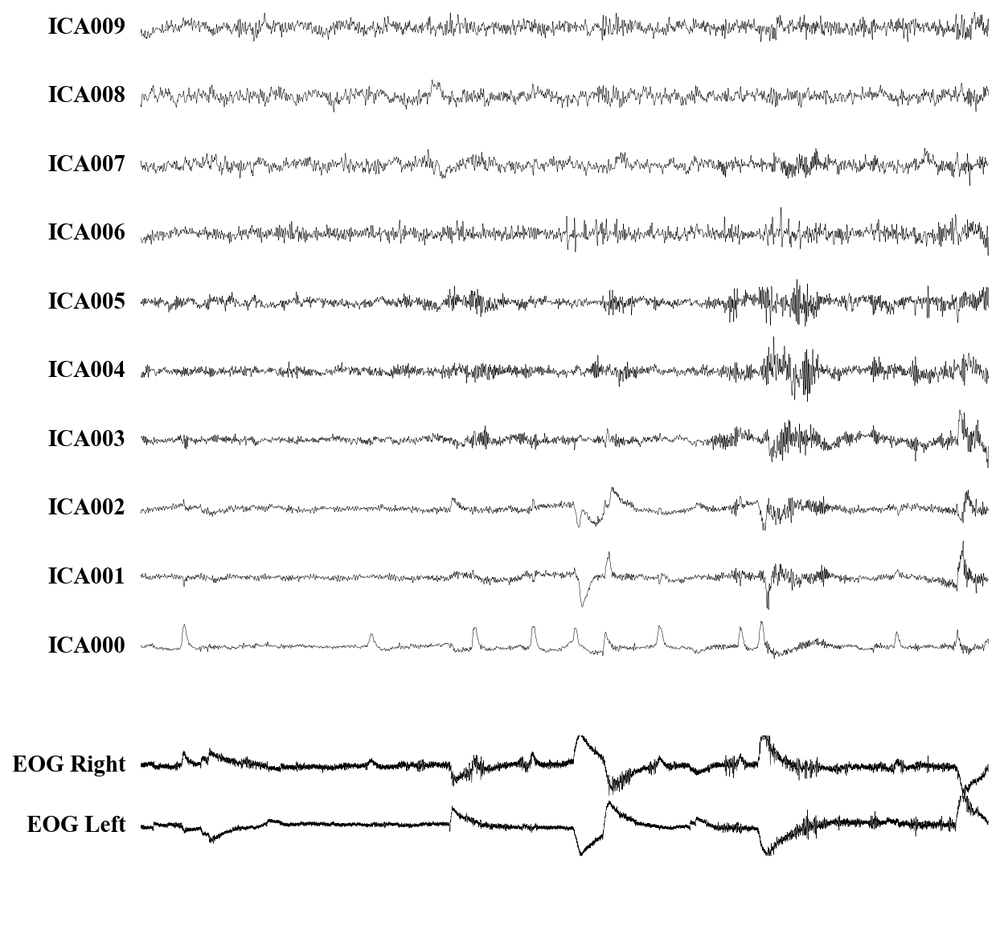

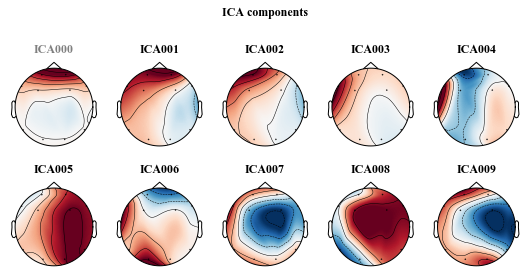

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.1s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
36


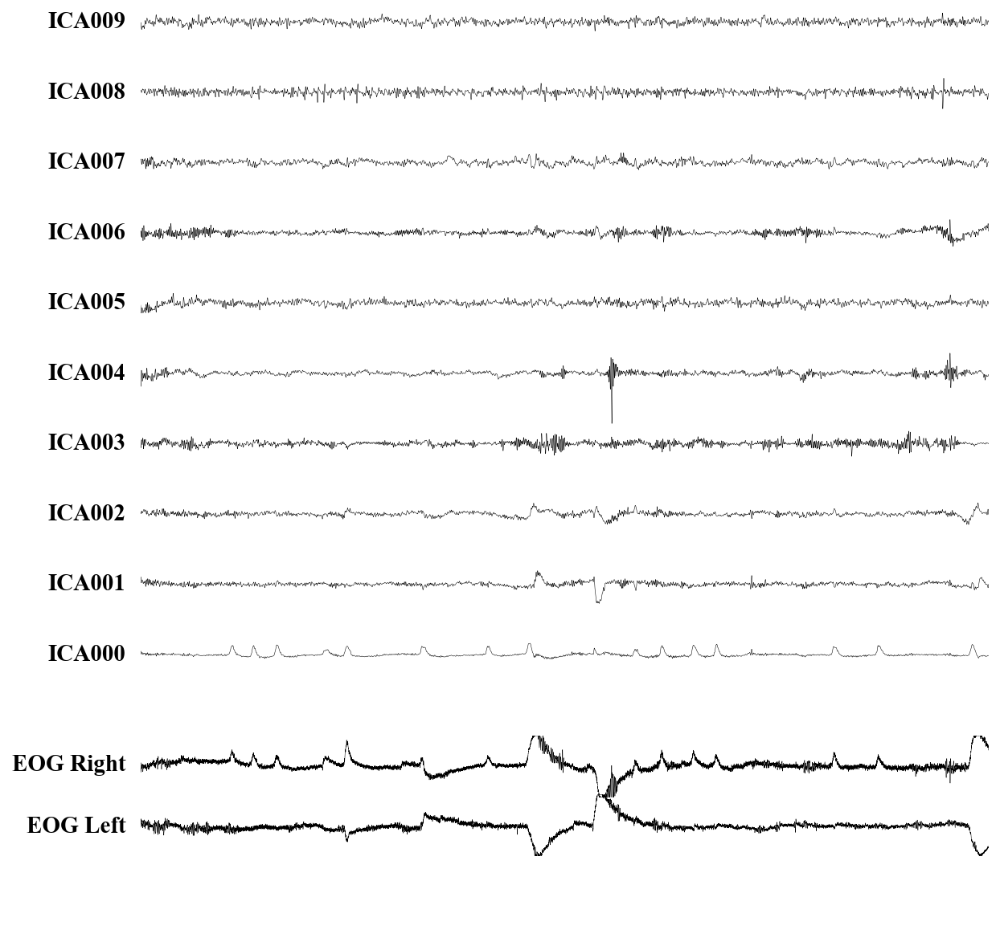

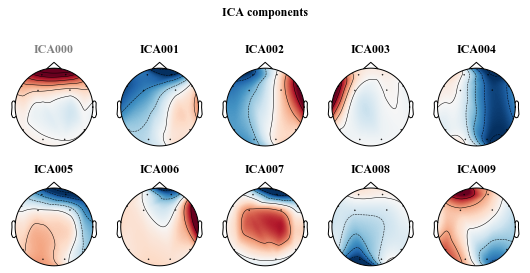

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.5s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
37


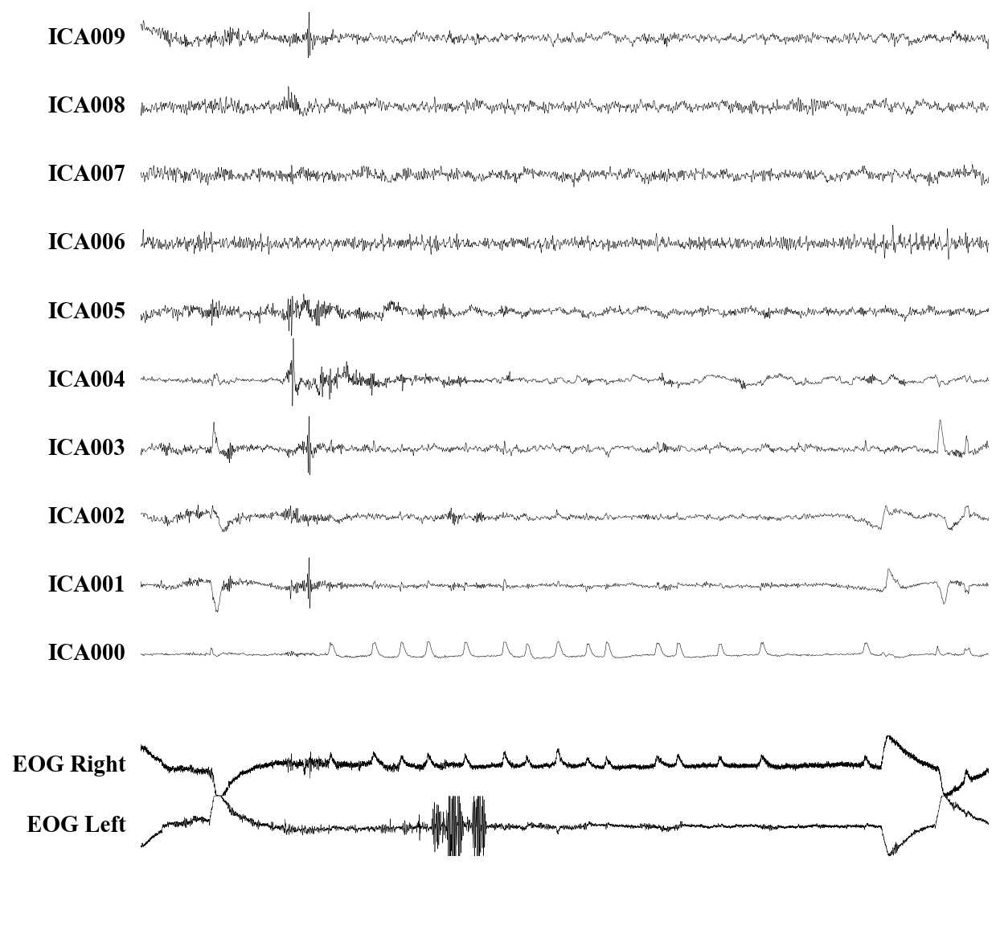

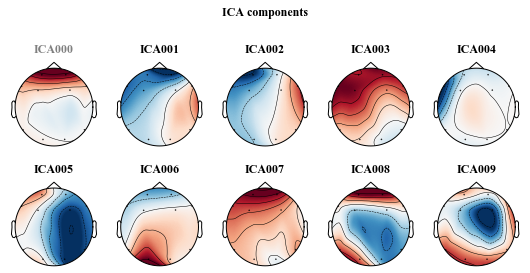

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.2s.
Transforming to ICA space (10 components)
Zeroing out 2 ICA components
38


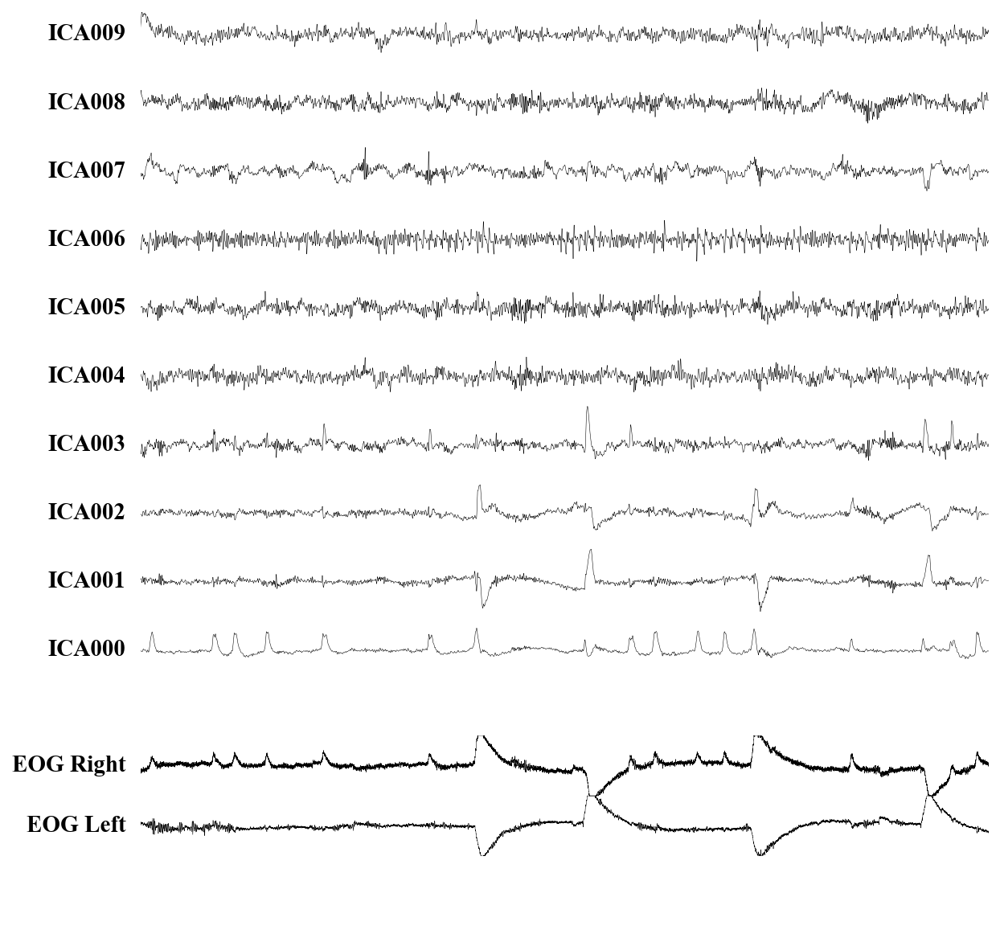

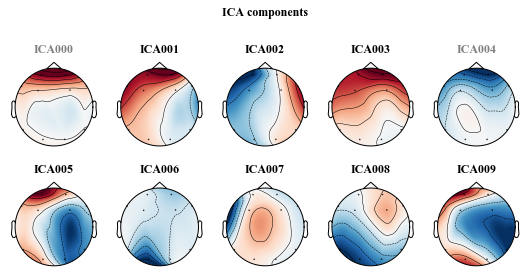

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.3s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
39


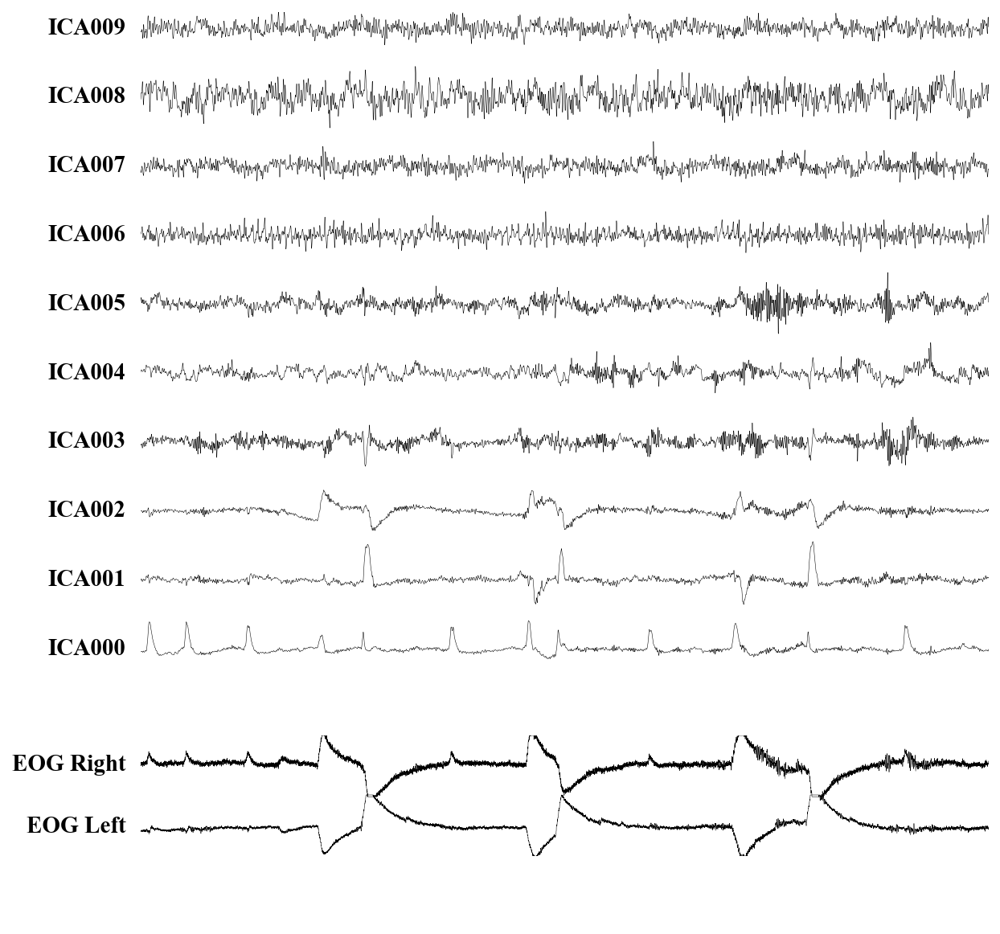

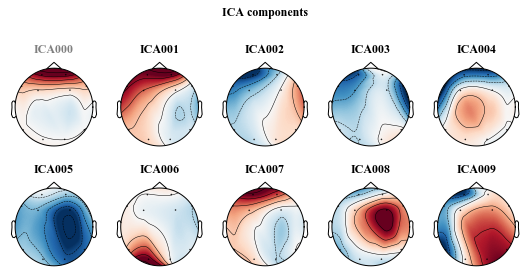

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.4s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
40


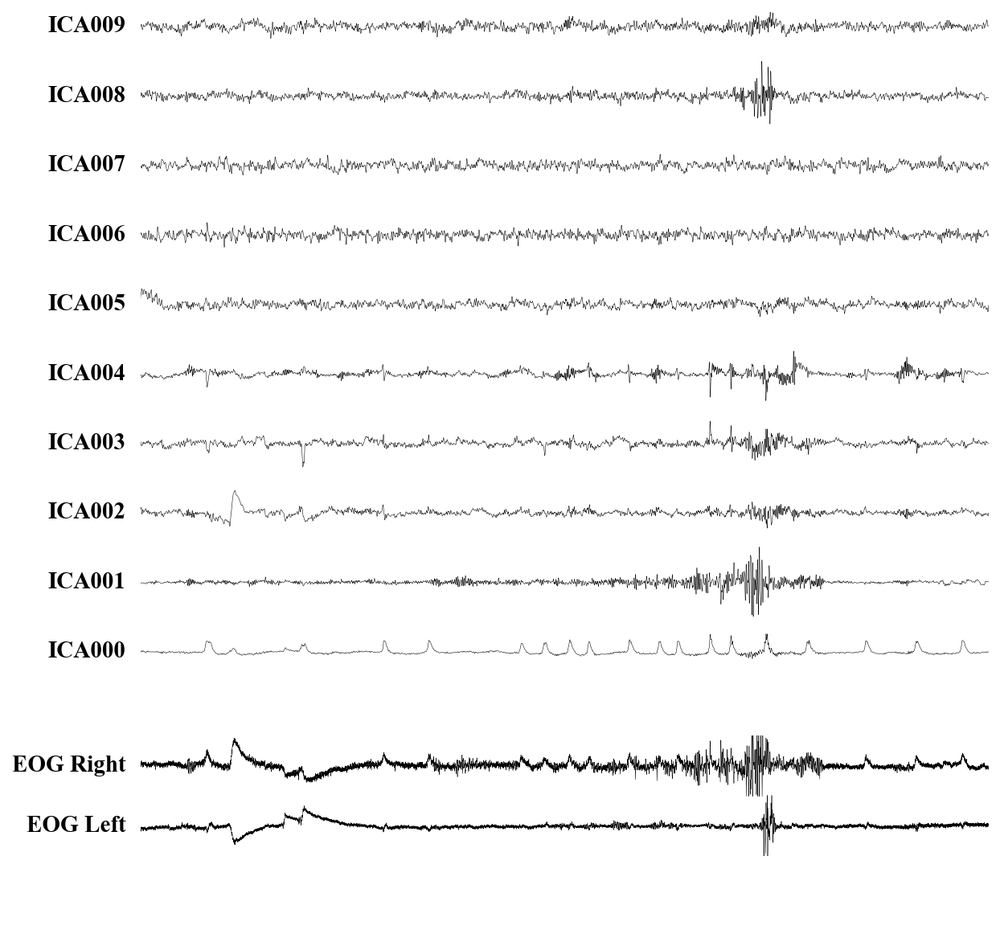

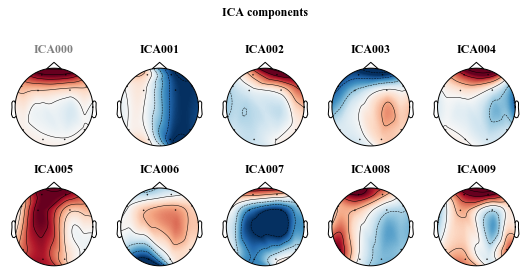

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.3s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
41


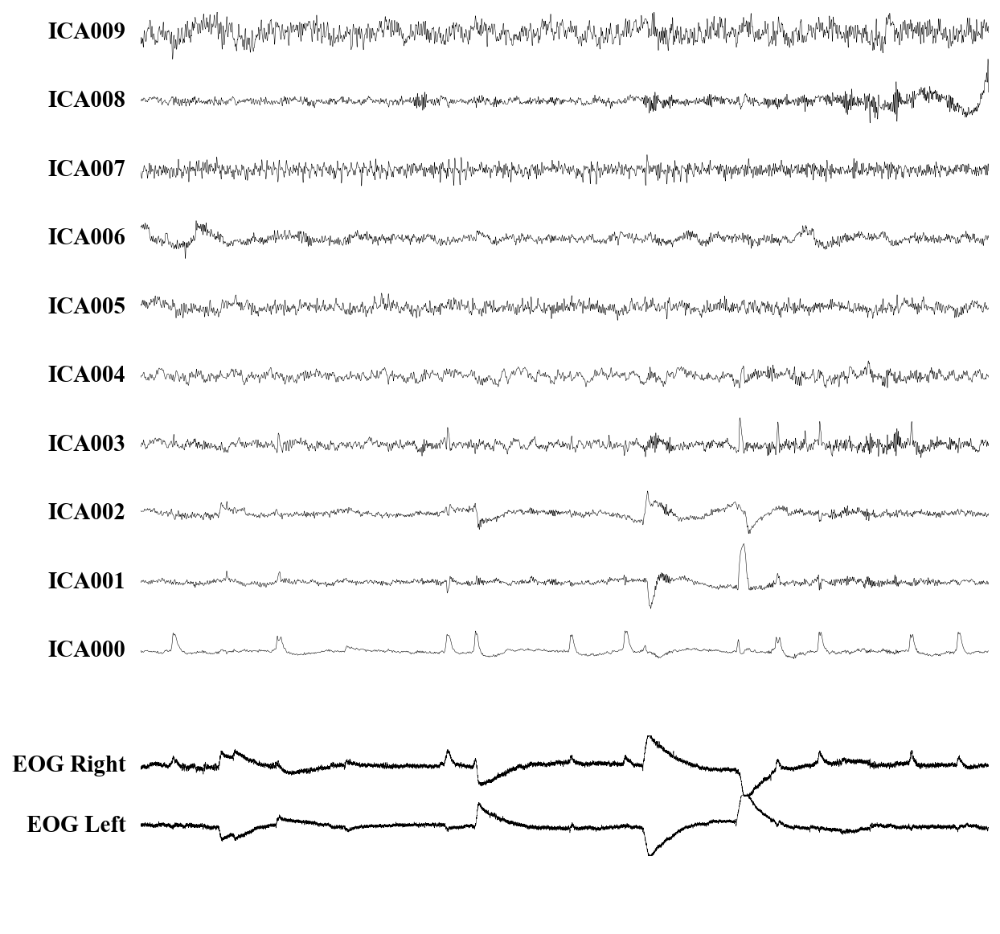

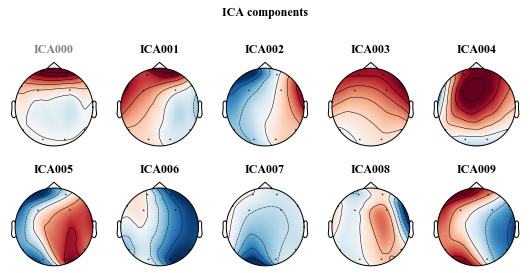

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.6s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
42


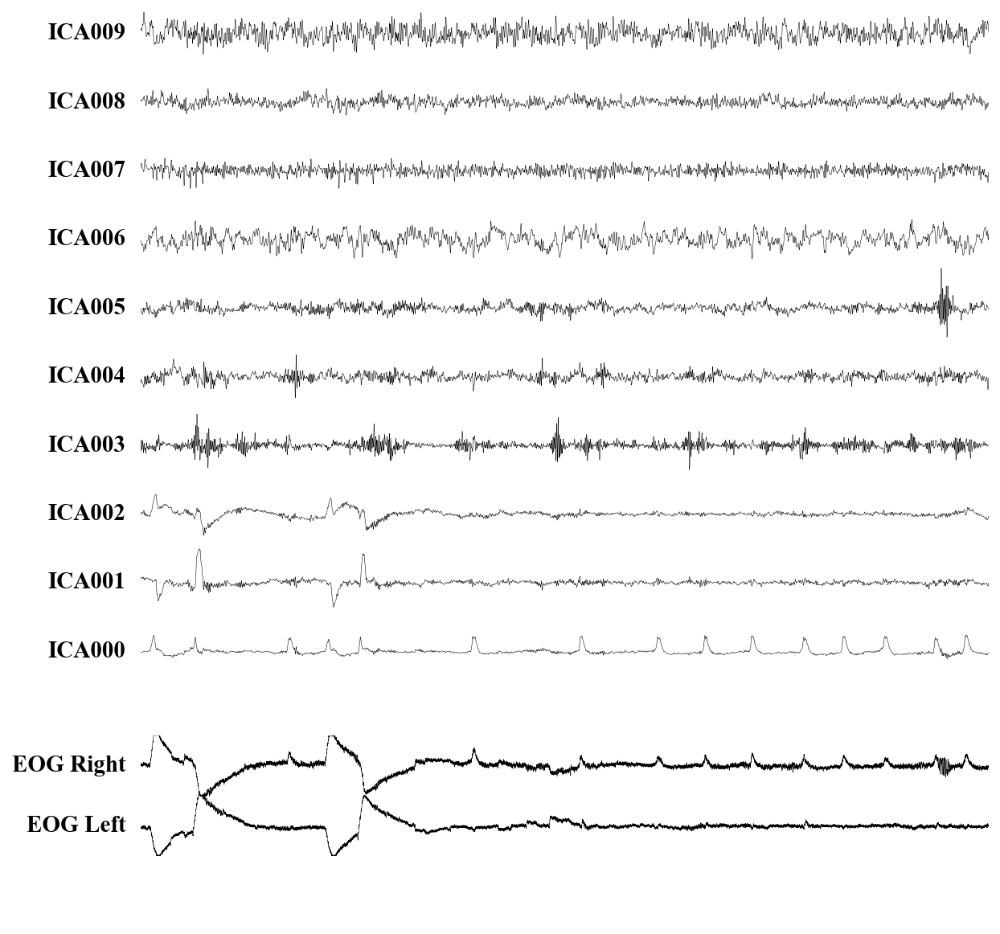

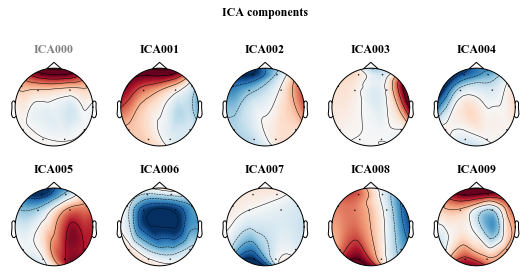

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.4s.
Transforming to ICA space (10 components)
Zeroing out 2 ICA components
43


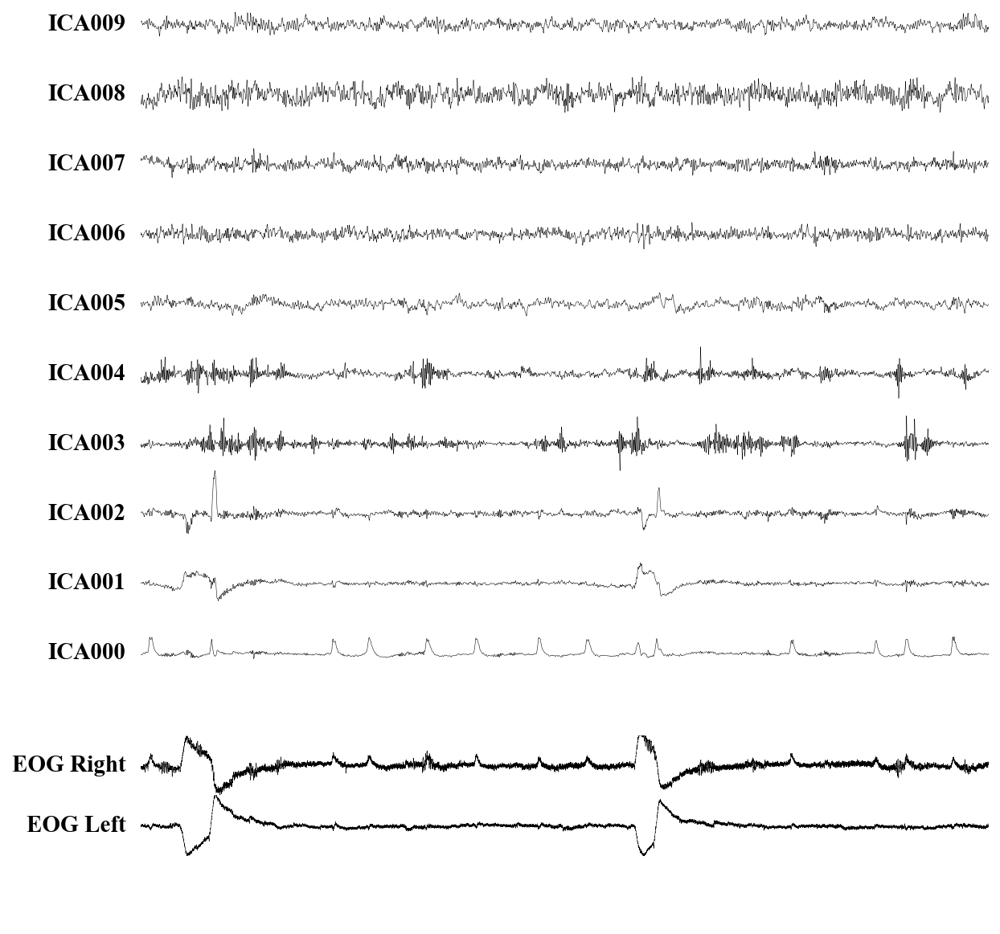

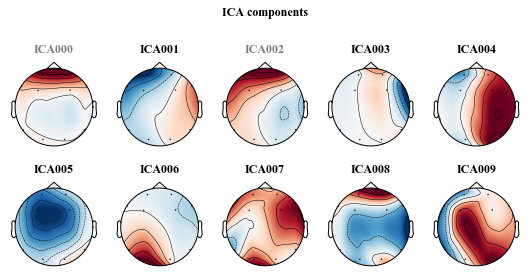

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.1s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
44


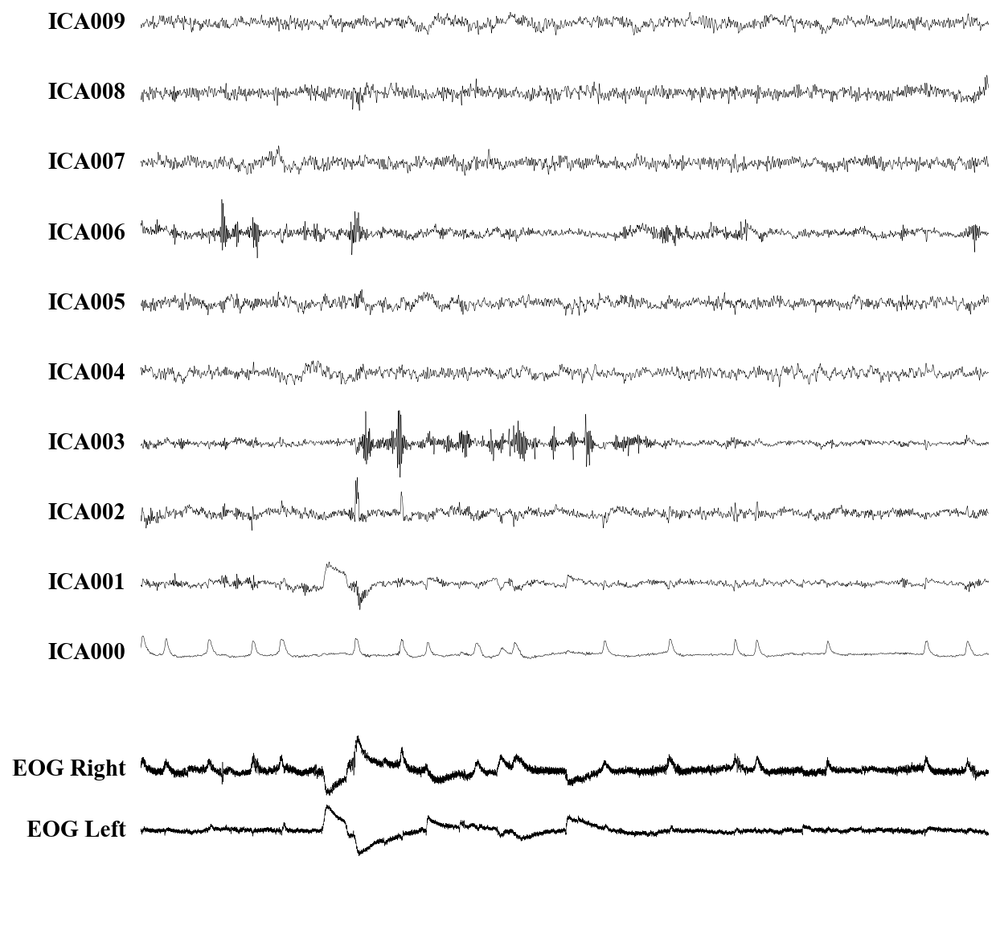

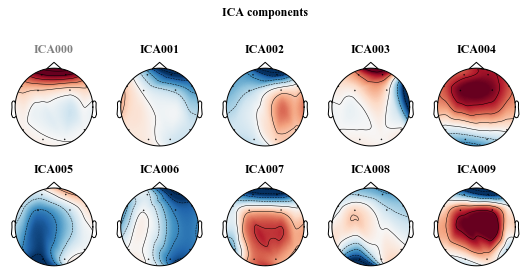

Fitting ICA to data using 10 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 10
Computing Extended Infomax ICA


<ipython-input-4-6700944a9e4a>:72: DeprecationWarning: method='extended-infomax' is deprecated and will be removed in 0.19. If you want to use Extended Infomax, specify method='infomax' together with fit_params=dict(extended=True).
  ica = ICA(method="extended-infomax", random_state=1)


Fitting ICA took 1.6s.
Transforming to ICA space (10 components)
Zeroing out 1 ICA components
45


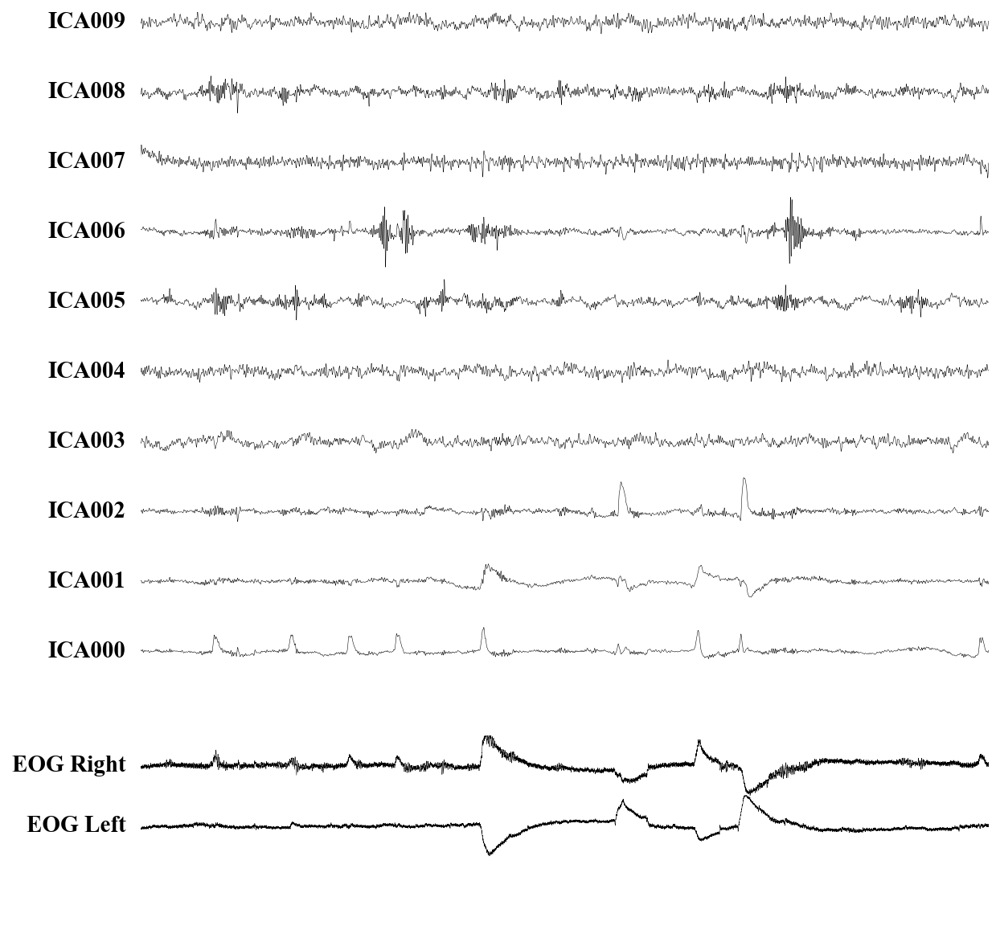

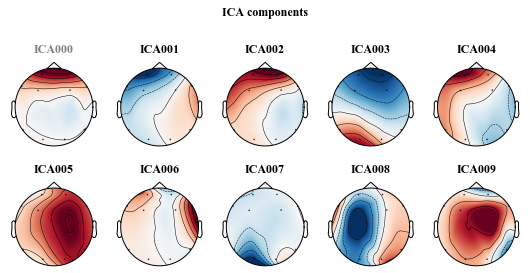

In [5]:
i = 0
for task in eeg.tasks:
        for c in chunks(task, 15):
            sample_raw, sample_raw_baseline, sample_raw_bandpass, sample_raw_eog = baseline_bandpass(c)
            ica, sample_raw_train, sample_raw_corrected = ica_pipe(sample_raw_bandpass)

            print(f"=======================\n{i}")
            # Save fig
            plot_sig(
                X = ica.get_sources(inst=sample_raw_train).get_data() * 1e6,
                fs = 500,
                dpi = dpi,
                eog_unit = "μV",
                ch_names = ica.get_sources(inst=sample_raw_train).ch_names,
                X_EOG = sample_raw_eog.get_data() * 1e6,
                eog_ch_names = sample_raw_eog.ch_names,
            #                 fname = f"{_path}figure3_{i}",
                hide_scale=True
            )
            
            
            ica.plot_components(inst=sample_raw_train)

            i=i+1